In [1]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.9/981.9 kB 46.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 108.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

In [2]:
!pip install -q kaggle
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets list

Saving kaggle.json to kaggle.json
ref                                                       title                                                     size  lastUpdated                 downloadCount  voteCount  usabilityRating  
--------------------------------------------------------  --------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
abdulmalik1518/cars-datasets-2025                         Cars Datasets (2025)                                     25987  2025-07-17 21:43:28.493000           4621        109  1.0              
sahilislam007/college-student-placement-factors-dataset   College Student Placement Factors Dataset               110450  2025-07-02 08:33:50.547000           7894        163  1.0              
khushikyad001/air-quality-weather-and-respiratory-health  Air Quality, Weather, and Respiratory Health            523894  2025-07-24 15:42:21.873000            876         26  1.0           

In [3]:
!kaggle competitions download -c global-wheat-detection

 86% 520M/607M [00:00<00:00, 1.36GB/s]
100% 607M/607M [00:00<00:00, 1.34GB/s]


In [4]:
! unzip global-wheat-detection.zip

Archive:  global-wheat-detection.zip
  inflating: sample_submission.csv   
  inflating: test/2fd875eaa.jpg      
  inflating: test/348a992bb.jpg      
  inflating: test/51b3e36ab.jpg      
  inflating: test/51f1be19e.jpg      
  inflating: test/53f253011.jpg      
  inflating: test/796707dd7.jpg      
  inflating: test/aac893a91.jpg      
  inflating: test/cb8d261a3.jpg      
  inflating: test/cc3532ff6.jpg      
  inflating: test/f5a1f0358.jpg      
  inflating: train.csv               
  inflating: train/00333207f.jpg     
  inflating: train/005b0d8bb.jpg     
  inflating: train/006a994f7.jpg     
  inflating: train/00764ad5d.jpg     
  inflating: train/00b5c6764.jpg     
  inflating: train/00b5fefed.jpg     
  inflating: train/00b70a919.jpg     
  inflating: train/00e903abe.jpg     
  inflating: train/00ea5e5ee.jpg     
  inflating: train/010b216d4.jpg     
  inflating: train/010c93b99.jpg     
  inflating: train/010dbcc8f.jpg     
  inflating: train/0114c88aa.jpg     
  inflating: 

In [5]:
!mkdir data
!mv train.csv data/
!mv train data/
!mv test data/

# Imports

In [6]:
import torch
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import patches
import random
import os
from pathlib import Path
import cv2
import pandas as pd
from torch.utils.data import Dataset, random_split, DataLoader
import albumentations as A
import torch.nn as nn
from torchvision import models
from tqdm import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.ops import nms
import pickle
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.nn import functional as F

# Utility Funcitons

In [23]:
def plot_bboxes(image, bboxes, title="Image with Bboxes"):
    """
    Simple function to plot bounding boxes on an image with error handling

    Args:
        image: numpy array (H, W, C)
        bboxes: list of bboxes in [x_min, y_min, x_max, y_max] format
        title: plot title
    """
    os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    ax.imshow(image)
    ax.set_title(title)

    for bbox in bboxes:
        # format: [x_min y_min, x_max, y_max]
        x_min, y_min, x_max, y_max , _, _= bbox
        width = x_max - x_min
        height = y_max - y_min

        rect = patches.Rectangle((x_min, y_min), width, height,
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    plt.show()


def set_seed(seed):
    """
    Set seeds for reproducible training results
    """
    # Python random
    random.seed(seed)

    # Numpy random
    np.random.seed(seed)

    # PyTorch random
    torch.manual_seed(seed)

    # PyTorch CUDA random (for GPU)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # For multi-GPU setups

    # Make PyTorch deterministic (slower but more reproducible)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


def calculate_iou(box1, box2):
    """Calculate IoU between two sets of boxes."""
    # Convert (x, y, w, h) to (x1, y1, x2, y2)
    box1_x1 = box1[..., 0] - box1[..., 2] / 2
    box1_y1 = box1[..., 1] - box1[..., 3] / 2
    box1_x2 = box1[..., 0] + box1[..., 2] / 2
    box1_y2 = box1[..., 1] + box1[..., 3] / 2

    box2_x1 = box2[..., 0] - box2[..., 2] / 2
    box2_y1 = box2[..., 1] - box2[..., 3] / 2
    box2_x2 = box2[..., 0] + box2[..., 2] / 2
    box2_y2 = box2[..., 1] + box2[..., 3] / 2

    # Calculate intersection
    inter_x1 = torch.max(box1_x1, box2_x1)
    inter_y1 = torch.max(box1_y1, box2_y1)
    inter_x2 = torch.min(box1_x2, box2_x2)
    inter_y2 = torch.min(box1_y2, box2_y2)

    inter_area = torch.clamp(inter_x2 - inter_x1, min=0) * torch.clamp(inter_y2 - inter_y1, min=0)

    # Calculate union
    box1_area = (box1_x2 - box1_x1) * (box1_y2 - box1_y1)
    box2_area = (box2_x2 - box2_x1) * (box2_y2 - box2_y1)
    union_area = box1_area + box2_area - inter_area

    # Calculate IoU
    iou = inter_area / (union_area + 1e-6)
    return iou

def decode_outputs(output, S=7, B=2, C=1, img_size=448, conf_thresh=0.25):
    boxes = []
    scores = []
    labels = []

    cell_size = img_size / S  # e.g., 448/7 = 64
    for row in range(S):
        for col in range(S):
            for b in range(B):
                # Extract box info
                bx = output[row,col,b*5]
                by = output[row,col,b*5+1]
                bw = output[row,col,b*5+2]
                bh = output[row,col,b*5+3]
                conf = output[row,col,b*5+4]

                # CLASS SCORE: last element in the 11-dim vector
                class_score = output[row, col, B * 5]  # index 10

                # Final confidence = confidence * class probability
                final_score = conf * class_score

                # Skip low-confidence boxes
                if final_score < conf_thresh:
                    continue

                # Convert to image coordinates
                x_center = (col + bx) * cell_size
                y_center = (row + by) * cell_size
                w = bw * img_size
                h = bh * img_size

                # x1 = x_center - w/2
                # y1 = y_center - h/2
                # x2 = x_center + w/2
                # y2 = y_center + h/2

                boxes.append([x_center,y_center,w,h])
                scores.append(conf.item())
                labels.append(1)  # Only 1 class

    return {
        "boxes": torch.tensor(boxes, dtype=torch.float32),
        "scores": torch.tensor(scores, dtype=torch.float32),
        "labels": torch.tensor(labels, dtype=torch.int64)
    }

def decode_target(target, S=7, img_size=448):
    boxes = []
    labels = []

    cell_size = img_size / S

    for row in range(S):
        for col in range(S):
            obj = target[row,col,4]  # confidence indicator
            if obj == 0:
                continue

            bx = target[row,col,0]
            by = target[row,col,1]
            bw = target[row,col,2]
            bh = target[row,col,3]

            x_center = (col + bx) * cell_size
            y_center = (row + by) * cell_size
            w = bw * img_size
            h = bh * img_size

            x1 = x_center - w / 2
            y1 = y_center - h / 2
            x2 = x_center + w / 2
            y2 = y_center + h / 2

            boxes.append([x1,y1,x2,y2])
            labels.append(0)  # Only 1 class

    return {
        "boxes": torch.tensor(boxes, dtype=torch.float32),
        "labels": torch.tensor(labels, dtype=torch.int64)
    }



def extract_bboxes(predictions, conf_threshold=0.25, model_img_size=448, target_img_size=1024):
    """
    Extract bounding boxes from raw YOLOv1 predictions and scale to target image size
    """
    batch_size, S, _, _ = predictions.shape

    # Calculate scaling factor
    scale_factor = target_img_size / model_img_size  # 1024 / 448 = 2.286

    for batch_idx in range(batch_size):
        boxes = []

        for i in range(S):
            for j in range(S):
                cell_pred = predictions[batch_idx, i, j]

                # Extract both boxes from this cell
                box1 = cell_pred[:5]  # [x, y, w, h, conf]
                box2 = cell_pred[5:10]  # [x, y, w, h, conf]
                class_probs = cell_pred[10:]

                class_conf, class_id = torch.max(class_probs, dim=0)

                # Pick the box with higher confidence
                conf1 = box1[4].item()
                conf2 = box2[4].item()

                if conf1 > conf2:
                    best_box = box1
                    best_conf = conf1
                else:
                    best_box = box2
                    best_conf = conf2

                # Only process if the best box passes threshold
                if best_conf > conf_threshold:
                    # Convert coordinates
                    x_center = (j + best_box[0]) * model_img_size / S
                    y_center = (i + best_box[1]) * model_img_size / S
                    width = best_box[2].item() * model_img_size
                    height = best_box[3].item() * model_img_size

                    # Convert to corner format
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2

                    # Scale to target image size
                    x1 *= scale_factor
                    y1 *= scale_factor
                    x2 *= scale_factor
                    y2 *= scale_factor

                    final_conf = best_conf * class_conf.item()

                    boxes.append([
                        x1.item(), y1.item(), x2.item(), y2.item(),
                        final_conf,
                        class_id.item()
                    ])

    return boxes

def analyze_multi_run_training(list_of_histories, model_type):
    """
    Analyze training results from multiple runs with different seeds

    Args:
        list_of_histories: List of history dictionaries from multiple training runs

    Returns:
        Dictionary containing mean trajectories and standard deviations for:
        - train_loss, val_loss, train_mAP, val_mAP
    """

    # unpack results, all List[run1, run2, run3]
    train_losses = []
    val_losses = []
    train_mAPs = []
    val_mAPs = []
    for hist in list_of_histories:
        train_losses.append(hist['train_loss'])
        val_losses.append(hist['val_loss'])
        train_mAPs.append(hist['train_mAP'])
        val_mAPs.append(hist['val_mAP'])

    required_metrics = ['train_loss', 'val_loss', 'train_mAP', 'val_mAP']

    mean_train_losses = np.asarray(train_losses).mean(axis=0).flatten()
    mean_val_losses = np.asarray(val_losses).mean(axis=0).flatten()
    mean_train_mAPs = np.asarray(train_mAPs).mean(axis=0).flatten()
    mean_val_mAPs = np.asarray(val_mAPs).mean(axis=0).flatten()

    std_mean_train_loss = np.asarray(train_losses).std(axis=0).mean()
    std_mean_val_loss = np.asarray(val_losses).std(axis=0).mean()
    std_mean_train_mAPs = np.asarray(train_mAPs).std(axis=0).mean()
    std_mean_val_mAPs = np.asarray(val_mAPs).std(axis=0).mean()

    mean_result_list = [mean_train_losses, mean_val_losses, mean_train_mAPs, mean_val_mAPs]

    # plot the results
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 8))
    loss_epochs = np.arange(len(mean_train_losses))
    mAP_epochs = np.arange(0, len(mean_train_losses), 5)

    axes[0].plot(loss_epochs, mean_train_losses, 'b-', label='Mean Training Loss')
    axes[0].plot(mAP_epochs, mean_val_losses, 'r-', label='Mean Validation Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Mean Loss')
    axes[0].set_title(f'Mean Training and Validation Loss - {model_type}')
    axes[0].text(0, 0, f'Train avg std: {std_mean_train_loss:.4f} \nVal avg std: {std_mean_val_loss:.4f}',
                 transform=axes[0].transAxes, verticalalignment='bottom')
    axes[0].legend()
    axes[0].grid(True)

    axes[1].plot(mAP_epochs, mean_train_mAPs, 'b-', label='Mean Training mAP')
    axes[1].plot(mAP_epochs, mean_val_mAPs, 'r-', label='Mean Validation mAP')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Mean mAP')
    axes[1].set_title(f'Mean Training and Validation mAP - {model_type}')
    axes[1].text(0.6, 0, f'Train avg std: {std_mean_train_mAPs:.4f} \nVal avg std: {std_mean_val_mAPs:.4f}',
                 transform=axes[1].transAxes, verticalalignment='bottom')
    axes[1].legend()
    axes[1].grid(True)

    results = {}

    for metric, result in zip(required_metrics, mean_result_list):
        results[metric] = result

    results['Mean Training Loss std'] = std_mean_train_loss
    results['Mean Validation mAP std'] = std_mean_val_loss
    results['Mean Training mAP std'] = std_mean_train_mAPs
    results['Mean Validation mAP std'] = std_mean_val_mAPs

    return results

# Custom Wheat Dataset

In [8]:
class WheatDataset(Dataset):
    """
    Custom Dataset for Global Wheat Detection Challenge

    Expected data structure:
    /data/
        train/
            *.jpg (images)
        train.csv (annotations with columns: image_id, width, height, bbox)

    bbox format in CSV: [x_min, y_min, width, height] (Pascal VOC format)
    """

    def __init__(self, data_dir, csv_file, apply_mosaic, grid_size, transforms=None, img_size=448):
        """
        Args:
            data_dir (str): Path to the data directory containing images
            csv_file (str): Path to CSV file with annotations
            apply_mosaic(Bool): apply mosaic augmentation or not
            grid_size(int): set the grid size for anchor generation
            transforms (albumentations.Compose): Augmentation pipeline
            img_size (int): Target image size for resizing
        """
        self.data_dir = Path(data_dir)
        self.img_size = img_size
        self.transforms = transforms
        self.apply_mosaic = apply_mosaic
        self.grid_size = grid_size

        # Load annotations
        self.df = pd.read_csv(csv_file)

        # Parse bounding boxes from string format if needed
        if isinstance(self.df['bbox'].iloc[0], str):
            self.df['bbox'] = self.df['bbox'].apply(eval)

        # Group by image_id to handle multiple boxes per image
        self.image_ids = self.df['image_id'].unique()

        print(f"Dataset initialized with {len(self.image_ids)} images")
        print(f"Total annotations: {len(self.df)}")

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        """
        Returns:
            image (torch.Tensor): Processed image tensor [3, H, W]
            target grid tensor [B, S, S, num_boxes*5+1]
        """
        image_id = self.image_ids[idx]

        # Load image
        img_path = self.data_dir / f"{image_id}.jpg"
        image = cv2.imread(str(img_path))

        # Get all bounding boxes for this image
        img_annotations = self.df[self.df['image_id'] == image_id]

        boxes = []

        for _, row in img_annotations.iterrows():
            bbox = row['bbox']  # [x_min, y_min, width, height]
            boxes.append(bbox)

        # Convert to numpy arrays for albumentations
        boxes = np.array(boxes, dtype=np.float32)

        image, boxes = self.mosaic_augmentation(image, boxes, p=1)

        # Apply transforms if specified
        if self.transforms:
            sample = self.transforms(
                image=image,
                bboxes=boxes,
            )
            image = sample['image']
            boxes = np.array(sample['bboxes'], dtype=np.float32)  # [x_min, y_min. w, h]
            if boxes.size == 0:  # If empty
                boxes = boxes.reshape((0, 4))  # Reshape to (0, 4)

        grid_tensor = torch.zeros(self.grid_size, self.grid_size, 11)

        # Normalize bboxes for YOLO
        for box in boxes:
            x, y, w, h = box

            x_center = (x + w / 2)  # x_center
            y_center = (y + h / 2)  # y_center

            cell_size = self.img_size / self.grid_size

            grid_x_index = int(x_center / cell_size)
            grid_y_index = int(y_center / cell_size)

            delta_x = (x_center % cell_size) / cell_size
            delta_y = (y_center % cell_size) / cell_size
            delta_w = w / self.img_size
            delta_h = h / self.img_size

            if not all(grid_tensor[grid_y_index, grid_x_index, :]):
                grid_tensor[grid_y_index, grid_x_index, 0:5] = torch.tensor([delta_x, delta_y, delta_w, delta_h, 1])
                grid_tensor[grid_y_index, grid_x_index, 5:10] = torch.tensor([delta_x, delta_y, delta_w, delta_h, 1])
                grid_tensor[grid_y_index, grid_x_index, 10] = torch.tensor(1)

        return image, grid_tensor

    def get_raw_item(self, idx):
        """
        Get raw image and target without any transforms.
        This is needed for mosaic augmentation.
        """
        image_id = self.image_ids[idx]

        # Load raw image
        img_path = self.data_dir / f"{image_id}.jpg"
        image = cv2.imread(str(img_path))

        # Get annotations for this image
        img_annotations = self.df[self.df['image_id'] == image_id]

        boxes = []

        for _, row in img_annotations.iterrows():
            bbox = row['bbox']  # [x_min, y_min, width, height]
            boxes.append(bbox)

        return image, boxes    # ndarray: [H, W, 3] | list of ndarrays [xmin ymin w h]

    def mosaic_augmentation(self, image, boxes, p=1):
        """
        Apply mosaic augmentation by combining 4 images in a 2x2 grid

        Args:
            image: Current image (H, W, 3)
            boxes: Current bounding boxes in [x_min, y_min, width, height] format
            p: Probability of applying mosaic

        Returns:
            mosaic_image: Augmented image (640, 640, 3)
            mosaic_boxes: Adjusted bounding boxes
        """
        # Check if we should apply mosaic
        if random.random() >= p:
            return image, boxes

        # Get 3 additional random samples
        additional_indices = random.choices(range(len(self)), k=3)

        # Collect all images, bboxes
        all_images = [image]
        all_bboxes = [boxes.tolist() if isinstance(boxes, np.ndarray) else boxes]   # all_boxes - list of lists, each has bboxes

        for idx in additional_indices:
            add_img, add_target = self.get_raw_item(idx)
            all_images.append(add_img)
            all_bboxes.append(add_target)

        # Create mosaic
        return self._create_mosaic(all_images, all_bboxes)

    def _create_mosaic(self, images, all_bboxes):
        """
        Create a 2x2 mosaic from 4 images and randomly crop 640x640

        Args:
            images: List of 4 images, each (1024, 1024, 3)
            all_bboxes: List of 4 bbox lists

        Returns:
            cropped_mosaic: (448, 448, 3) image
            final_bboxes: Adjusted bounding boxes
        """
        # Step 1: Shuffle the images, bboxes together for randomness
        combined = list(zip(images[:4], all_bboxes[:4]))
        random.shuffle(combined)
        shuffled_images, shuffled_bboxes = zip(*combined)

        # Step 2: Create 2x2 grid (2048x2048 total)
        # Concatenate top row (img[0] + img[1])
        top_row = np.concatenate([shuffled_images[0], shuffled_images[1]], axis=1)

        # Concatenate bottom row (img[2] + img[3])
        bottom_row = np.concatenate([shuffled_images[2], shuffled_images[3]], axis=1)

        # Concatenate top and bottom rows
        large_mosaic = np.concatenate([top_row, bottom_row], axis=0)  # Shape: (2048, 2048, 3)

        # Step 3: Adjust bounding boxes to large mosaic coordinates
        adjusted_bboxes = []

        # Offsets for each quadrant in the 2048x2048 mosaic
        offsets = [
            (0, 0),  # Top-left: img[0]
            (1024, 0),  # Top-right: img[1]
            (0, 1024),  # Bottom-left: img[2]
            (1024, 1024)  # Bottom-right: img[3]
        ]

        for i, (bboxes, (offset_x, offset_y)) in enumerate(zip(shuffled_bboxes, offsets)):
            for bbox in bboxes:
                if len(bbox) >= 4:  # Ensure valid bbox format
                    x_min, y_min, width, height = bbox[:4]

                    # Translate bbox to large mosaic coordinates
                    new_x_min = x_min + offset_x
                    new_y_min = y_min + offset_y

                    adjusted_bboxes.append([new_x_min, new_y_min, width, height])

        # Step 4: Randomly crop 448x448 from the 2048x2048 mosaic
        max_crop_x = 2048 - 448
        max_crop_y = 2048 - 448

        crop_x = random.randint(0, max_crop_x)
        crop_y = random.randint(0, max_crop_y)

        # Crop the image
        cropped_mosaic = large_mosaic[crop_y:crop_y + 448, crop_x:crop_x + 448]

        # Step 5: Adjust bounding boxes for the crop and filter
        final_bboxes = []

        for bbox in adjusted_bboxes:
            x_min, y_min, w, h = bbox

            # Translate bbox coordinates relative to crop
            new_x_min = x_min - crop_x
            new_y_min = y_min - crop_y
            x_max = x_min + w
            y_max = y_min + h
            new_x_max = x_max - crop_x
            new_y_max = y_max - crop_y

            # Clip to crop boundaries (0, 0, 448, 448)
            clipped_x_min = max(0, new_x_min)
            clipped_y_min = max(0, new_y_min)
            clipped_x_max = min(448, new_x_max)
            clipped_y_max = min(448, new_y_max)
            new_w = clipped_x_max - clipped_x_min
            new_h = clipped_y_max - clipped_y_min

            # Check if bbox is still valid after clipping
            if (clipped_x_max > clipped_x_min and
                    clipped_y_max > clipped_y_min and
                    (clipped_x_max - clipped_x_min) >= 8 and  # Minimum width
                    (clipped_y_max - clipped_y_min) >= 8):  # Minimum height

                final_bboxes.append([clipped_x_min, clipped_y_min, new_w, new_h])

        return cropped_mosaic, final_bboxes


transforms

In [9]:
def get_train_transforms(mean=(0.2140, 0.3170, 0.3142), std=(0.1747, 0.2089, 0.2061), img_size=448):
    """Training augmentations using Albumentations (your original)"""
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),
        A.RandomResizedCrop(size=(img_size, img_size), scale=(0.8, 1.0), p=0.5),
        A.Resize(height=img_size, width=img_size),
        A.Normalize(mean, std),
        A.ToTensorV2()
    ], bbox_params=A.BboxParams(
        format='coco',
        min_visibility=0.1
    ))


def get_val_transforms(mean=(0.2140, 0.3170, 0.3142), std=(0.1747, 0.2089, 0.2061), img_size=448):
    """Validation transforms (no augmentation) (your original)"""
    return A.Compose([
        A.Resize(height=img_size, width=img_size),
        A.Normalize(mean, std),
        A.ToTensorV2()
    ], bbox_params=A.BboxParams(
        format='coco',
        min_visibility=0.1
    ))

dataloaders

In [10]:
def get_all_dataloaders(data_dir, csv_file, grid_size, batch_size=16, val_split=0.2, seed=42):

    # Set seed for reproducibility
    torch.manual_seed(seed)

    # Create full dataset
    full_dataset = WheatDataset(
        data_dir=data_dir,
        csv_file=csv_file,
        apply_mosaic=True,
        grid_size=grid_size,
        transforms=get_train_transforms()
    )

    # Calculate split sizes
    total_size = len(full_dataset)
    val_size = int(val_split * total_size)
    train_size = total_size - val_size

    # Perform split
    train_dataset, val_dataset = random_split(
        full_dataset,
        [train_size, val_size],
        generator=torch.Generator().manual_seed(seed)
    )

    # Apply different transforms to validation set
    val_dataset.dataset.transforms = get_val_transforms()

    # Create dataloaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=8,
        pin_memory=True,
        drop_last=True
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=8,
        pin_memory=True,
        drop_last=True
    )

    return train_loader, val_loader


# Model definistion and Loss Function


In [11]:
class YOLOv1Loss(nn.Module):
    """
    YOLOv1 Loss function exactly as described in the paper.
    """

    def __init__(self, grid_size, num_boxes=2, num_classes=1,
                 lambda_coord=5.0, lambda_noobj=0.5):
        super(YOLOv1Loss, self).__init__()

        self.grid_size = grid_size
        self.num_boxes = num_boxes
        self.num_classes = num_classes
        self.lambda_coord = lambda_coord
        self.lambda_noobj = lambda_noobj

    def forward(self, predictions, targets):
        """
        Calculate YOLOv1 loss.

        Args:
            predictions: (batch_size, S, S, B*5 + C)
            targets: (batch_size, S, S, B*5 + C) - same format as predictions

        Returns:
            Total loss (scalar)
        """
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        predictions = predictions.to(device)
        targets = targets.to(device)
        batch_size = predictions.size(0)

        # Split predictions into components
        # For each grid cell: [x1, y1, w1, h1, conf1, x2, y2, w2, h2, conf2, class_probs...]
        pred_boxes = predictions[..., :self.num_boxes * 5].contiguous()
        pred_classes = predictions[..., self.num_boxes * 5:]

        # Split targets the same way
        target_boxes = targets[..., :self.num_boxes * 5].contiguous()
        target_classes = targets[..., self.num_boxes * 5:]

        # Reshape boxes: (batch, S, S, B, 5)
        pred_boxes = pred_boxes.view(batch_size, self.grid_size, self.grid_size, self.num_boxes, 5)
        target_boxes = target_boxes.view(batch_size, self.grid_size, self.grid_size, self.num_boxes, 5)

        # Calculate IoU between predicted and target boxes
        iou_b1 = calculate_iou(pred_boxes[..., 0, :], target_boxes[..., 0, :])
        iou_b2 = calculate_iou(pred_boxes[..., 1, :], target_boxes[..., 1, :])

        # Find which box has higher IoU with ground truth (batch, S, S)
        responsible_box = (iou_b1 > iou_b2).float()

        # Object mask: 1 if there's an object in the cell, 0 otherwise (batch, S, S)
        obj_mask = target_boxes[..., 0, 4]  # Use first box confidence as object indicator

        # Choose the responsible box predictions and targets
        # Use broadcasting to select responsible predictions
        pred_responsible = torch.zeros_like(pred_boxes[..., 0, :])  # (batch, S, S, 5)
        target_responsible = target_boxes[..., 0, :]  # Ground truth is in first box slot

        # Select coordinates from responsible box
        for i in range(5):  # x, y, w, h, conf
            pred_responsible[..., i] = (
                    responsible_box * pred_boxes[..., 0, i] +
                    (1 - responsible_box) * pred_boxes[..., 1, i]
            )

        # Coordinate loss (only for cells with objects)
        # Add small epsilon to prevent sqrt of negative numbers
        pred_w = torch.clamp(pred_responsible[..., 2], min=1e-6)
        pred_h = torch.clamp(pred_responsible[..., 3], min=1e-6)
        target_w = torch.clamp(target_responsible[..., 2], min=1e-6)
        target_h = torch.clamp(target_responsible[..., 3], min=1e-6)

        coord_loss = self.lambda_coord * obj_mask * (
                (pred_responsible[..., 0] - target_responsible[..., 0]) ** 2 +  # x
                (pred_responsible[..., 1] - target_responsible[..., 1]) ** 2 +  # y
                (torch.sqrt(pred_w) - torch.sqrt(target_w)) ** 2 +  # w
                (torch.sqrt(pred_h) - torch.sqrt(target_h)) ** 2  # h
        )

        # Confidence loss (object)
        conf_loss_obj = obj_mask * (pred_responsible[..., 4] - target_responsible[..., 4]) ** 2

        # Confidence loss (no object) - penalize both boxes when no object
        conf_loss_noobj = self.lambda_noobj * (1 - obj_mask) * (
                pred_boxes[..., 0, 4] ** 2 + pred_boxes[..., 1, 4] ** 2
        )

        # Class loss (only for cells with objects)
        # Sum over classes, then apply object mask
        class_loss_per_cell = torch.sum((pred_classes - target_classes) ** 2, dim=-1)
        class_loss = obj_mask * class_loss_per_cell

        # Sum all losses
        total_loss = (
                             coord_loss.sum() +
                             conf_loss_obj.sum() +
                             conf_loss_noobj.sum() +
                             class_loss.sum()
                     ) / batch_size

        return total_loss


Yolov1 with ResNet18 backbone and couple of conv layers as feature extractor

In [12]:
class Yolov1(nn.Module):
    def __init__(self, grid_size, num_boxes, num_classes):
        super().__init__()
        self.grid_size = grid_size
        self.num_boxes = num_boxes
        self.num_classes = num_classes
        self.output_size = num_boxes * 5 + num_classes

        # Load pretrained ResNet-18 as backbone (exclude last 2 layers which are not feature extractors)
        resnet_pre = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        self.backbone = nn.Sequential(*list(resnet_pre.children())[:-2])

        # Freeze early layers for domain adaptation
        layers_to_freeze = list(self.backbone.children())[:6]  # First 6 layers
        for layer in layers_to_freeze:
            for param in layer.parameters():
                param.requires_grad = False

        # adapt ResNet18 output for yolov1 detection head
        self.adapter = nn.Sequential(
            # Increase channels from 512 to 1024
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1, inplace=True),

            # Reduce spatial size from 14x14 to 7x7
            nn.Conv2d(1024, 1024, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.1, inplace=True),

            # Final conv layers (similar to original YOLOv1)
            nn.Conv2d(1024, 1024, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(1024, 1024, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1, inplace=True)
        )

        # Detection head
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(grid_size * grid_size * 1024, 4096),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, grid_size * grid_size * self.output_size)
        )

    def forward(self, x):
        """Forward pass through ResNet18 backbone + YOLOv1 head."""
        # Extract features with ResNet18 backbone
        features = self.backbone(x)  # (batch, 512, 14, 14)

        # Adapt to YOLOv1 requirements
        features = self.adapter(features)  # (batch, 1024, 7, 7)

        # Get predictions from classifier
        predictions = self.classifier(features)

        # Reshape to grid format
        batch_size = x.size(0)
        predictions = predictions.view(
            batch_size,
            self.grid_size,
            self.grid_size,
            self.output_size
        )

        return predictions

    def predict(self, x, conf_threshold=0.5, nms_threshold=0.5):
        """Inference method with post-processing"""
        self.eval()
        with torch.no_grad():
            raw_predictions = self.forward(x)
            detections = post_process_predictions(raw_predictions, conf_threshold, nms_threshold)
        return detections


def post_process_predictions(predictions, conf_threshold=0.5, nms_threshold=0.5):
    """
    Post-process YOLOv1 predictions using torchvision NMS
    """
    batch_size, S, S, _ = predictions.shape
    all_detections = []

    for batch_idx in range(batch_size):
        detections = []

        for i in range(S):
            for j in range(S):
                # Extract predictions for this grid cell
                cell_pred = predictions[batch_idx, i, j]

                # Get both bounding boxes
                box1 = cell_pred[:5]  # [x, y, w, h, conf]
                box2 = cell_pred[5:10]  # [x, y, w, h, conf]
                class_probs = cell_pred[10:]  # class probabilities

                # Process each box if confidence > threshold
                for box_idx, box in enumerate([box1, box2]):
                    conf = box[4].item()
                    if conf > conf_threshold:
                        # Convert to absolute coordinates
                        x_center = (j + box[0]) / S  # Normalize to [0,1]
                        y_center = (i + box[1]) / S
                        width = box[2]
                        height = box[3]

                        # Convert to [x1, y1, x2, y2] format for NMS
                        x1 = x_center - width / 2
                        y1 = y_center - height / 2
                        x2 = x_center + width / 2
                        y2 = y_center + height / 2

                        # Get class with highest probability
                        class_conf, class_id = torch.max(class_probs, dim=0)
                        final_conf = conf * class_conf.item()

                        detections.append({
                            'bbox': [x1, y1, x2, y2],
                            'confidence': final_conf,
                            'class_id': class_id.item()
                        })

        # Apply torchvision NMS 🎯
        if detections:
            boxes = torch.tensor([d['bbox'] for d in detections])
            scores = torch.tensor([d['confidence'] for d in detections])

            # Use torchvision NMS - much simpler!
            keep_indices = nms(boxes, scores, nms_threshold)

            final_detections = [detections[i] for i in keep_indices]
        else:
            final_detections = []

        all_detections.append(final_detections)

    return detections_to_tensor(all_detections, batch_size, S)


def apply_nms(boxes, scores, iou_threshold=0.5):
    """Simple wrapper around torchvision NMS"""
    return nms(boxes, scores, iou_threshold)

def detections_to_tensor(all_detections, batch_size, grid_size=7, num_classes=1):
    """
    Convert post-processed detections back to YOLOv1 tensor format

    Args:
        all_detections: List of length batch_size, each containing detection dicts
        batch_size: Number of images in batch
        grid_size: Grid size (default 7)
        num_classes: Number of classes (default 1)

    Returns:
        tensor: Shape [batch_size, grid_size, grid_size, 2*5 + num_classes]
    """
    # Initialize output tensor
    output_tensor = torch.zeros(batch_size, grid_size, grid_size, 2*5 + num_classes)

    for batch_idx, detections in enumerate(all_detections):
        for detection in detections:
            # Extract detection info
            bbox = detection['bbox']  # [x1, y1, x2, y2] in [0,1] coordinates
            confidence = detection['confidence']
            class_id = detection['class_id']

            # Convert [x1, y1, x2, y2] to [x_center, y_center, width, height]
            x1, y1, x2, y2 = bbox
            x_center = (x1 + x2) / 2  # Center x in [0,1]
            y_center = (y1 + y2) / 2  # Center y in [0,1]
            width = x2 - x1           # Width in [0,1]
            height = y2 - y1          # Height in [0,1]

            # Determine which grid cell this detection belongs to
            grid_x = int(x_center * grid_size)
            grid_y = int(y_center * grid_size)

            # Clamp to valid grid indices
            grid_x = max(0, min(grid_x, grid_size - 1))
            grid_y = max(0, min(grid_y, grid_size - 1))

            # Convert to YOLOv1 format (relative to grid cell for x,y)
            cell_x = (x_center * grid_size) - grid_x  # Offset within cell [0,1]
            cell_y = (y_center * grid_size) - grid_y  # Offset within cell [0,1]
            # Width and height remain relative to full image [0,1]

            # Find an available box slot in this grid cell
            # Check first box slot
            if output_tensor[batch_idx, grid_y, grid_x, 4] == 0:  # First box available
                output_tensor[batch_idx, grid_y, grid_x, 0] = cell_x
                output_tensor[batch_idx, grid_y, grid_x, 1] = cell_y
                output_tensor[batch_idx, grid_y, grid_x, 2] = width
                output_tensor[batch_idx, grid_y, grid_x, 3] = height
                output_tensor[batch_idx, grid_y, grid_x, 4] = confidence
            # Check second box slot
            elif output_tensor[batch_idx, grid_y, grid_x, 9] == 0:  # Second box available
                output_tensor[batch_idx, grid_y, grid_x, 5] = cell_x
                output_tensor[batch_idx, grid_y, grid_x, 6] = cell_y
                output_tensor[batch_idx, grid_y, grid_x, 7] = width
                output_tensor[batch_idx, grid_y, grid_x, 8] = height
                output_tensor[batch_idx, grid_y, grid_x, 9] = confidence
            # If both slots are occupied, skip (this shouldn't happen after NMS)

            # Set class probability (for single class, just set to 1.0)
            if num_classes == 1:
                output_tensor[batch_idx, grid_y, grid_x, 10] = 1.0
            else:
                # For multi-class, set the specific class
                output_tensor[batch_idx, grid_y, grid_x, 10 + class_id] = 1.0

    return output_tensor


FPN_Yolo

In [13]:
class FPNNeck(nn.Module):
    def __init__(self, in_channels_list, out_channels):
        super(FPNNeck, self).__init__()

        # Lateral connections (1x1 convolutions)
        self.lateral_convs = nn.ModuleList([
            nn.Conv2d(in_channels, out_channels, 1)
            for in_channels in in_channels_list
        ])

        # Top-down pathway (upsampling + smoothing)
        self.fpn_convs = nn.ModuleList([
            nn.Conv2d(out_channels, out_channels, 3, padding=1)
            for _ in range(len(in_channels_list))
        ])

    def forward(self, features):
        # features should be ordered from the highest resolution to lowest
        laterals = [conv(feature) for feature, conv in zip(features, self.lateral_convs)]

        # Top-down pathway
        for i in range(len(laterals) - 1, 0, -1):
            laterals[i - 1] += nn.functional.interpolate(
                laterals[i], size=laterals[i - 1].shape[-2:], mode='nearest'
            )

        # Smoothing
        outputs = [conv(lateral) for lateral, conv in zip(laterals, self.fpn_convs)]
        return outputs


class FPNYolo(nn.Module):
    def __init__(self, grid_size, num_boxes, num_classes):
        super().__init__()
        self.grid_size = grid_size
        self.num_boxes = num_boxes
        self.num_classes = num_classes
        self.output_size = num_boxes * 5 + num_classes

        # Load pretrained ResNet-18 as backbone (exclude last 2 layers which are not feature extractors)
        resnet_pre = models.resnet18(weights = models.ResNet18_Weights.DEFAULT)
        self.backbone_stages = nn.ModuleList([
            nn.Sequential(resnet_pre.conv1, resnet_pre.bn1, resnet_pre.relu, resnet_pre.maxpool, resnet_pre.layer1),    # 64ch
            resnet_pre.layer2,  # 128ch
            resnet_pre.layer3,  # 256ch
            resnet_pre.layer4  # 512ch
        ])

        # Freeze early layers for domain adaptation
        for i in range(2):  # Freeze first 2 stages
            for param in self.backbone_stages[i].parameters():
                param.requires_grad = False

        # FPN neck
        in_channels_list = [64, 128, 256, 512]  # ResNet-18 output channels
        self.fpn = FPNNeck(in_channels_list, out_channels=256)

        # Detection head
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(grid_size * grid_size * 1024, 4096),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(4096, grid_size * grid_size * self.output_size)
        )

    def forward(self, x):
        """Forward pass through ResNet18 backbone + YOLOv1 head."""
        # Extract features with ResNet18 backbone and save the outputs of individual layers for FPN
        features = []
        for stage in self.backbone_stages:
            x = stage(x)
            features.append(x)  # Collect [64ch, 128ch, 256ch, 512ch] outputs

        fpn_features = self.fpn(features)  # input list of features from layers to pass in FPN

        # Resize all to 7x7 and concatenate
        target_size = (self.grid_size, self.grid_size)
        resized_features = []
        for feat in fpn_features:
            if feat.shape[-2:] != target_size:
                resized = F.interpolate(feat, size=target_size, mode='bilinear', align_corners=False)
            else:
                resized = feat
            resized_features.append(resized)

        fused_features = torch.cat(resized_features, dim=1)  # [B, 1024, S, S]

        # Get predictions from classifier
        predictions = self.classifier(fused_features)

        # Reshape to grid format
        batch_size = x.size(0)
        predictions = predictions.view(
            batch_size,
            self.grid_size,
            self.grid_size,
            self.output_size
        )

        return predictions

    def predict(self, x, conf_threshold=0.5, nms_threshold=0.5):
        """Inference method with post-processing"""
        self.eval()
        with torch.no_grad():
            raw_predictions = self.forward(x)
            detections = post_process_predictions(raw_predictions, conf_threshold, nms_threshold)
        return detections


def post_process_predictions(predictions, conf_threshold=0.5, nms_threshold=0.5):
    """
    Post-process YOLOv1 predictions using torchvision NMS
    """
    batch_size, S, S, _ = predictions.shape
    all_detections = []

    for batch_idx in range(batch_size):
        detections = []

        for i in range(S):
            for j in range(S):
                # Extract predictions for this grid cell
                cell_pred = predictions[batch_idx, i, j]

                # Get both bounding boxes
                box1 = cell_pred[:5]  # [x, y, w, h, conf]
                box2 = cell_pred[5:10]  # [x, y, w, h, conf]
                class_probs = cell_pred[10:]  # class probabilities

                # Process each box if confidence > threshold
                for box_idx, box in enumerate([box1, box2]):
                    conf = box[4].item()
                    if conf > conf_threshold:
                        # Convert to absolute coordinates
                        x_center = (j + box[0]) / S  # Normalize to [0,1]
                        y_center = (i + box[1]) / S
                        width = box[2]
                        height = box[3]

                        # Convert to [x1, y1, x2, y2] format for NMS
                        x1 = x_center - width / 2
                        y1 = y_center - height / 2
                        x2 = x_center + width / 2
                        y2 = y_center + height / 2

                        # Get class with highest probability
                        class_conf, class_id = torch.max(class_probs, dim=0)
                        final_conf = conf * class_conf.item()

                        detections.append({
                            'bbox': [x1, y1, x2, y2],
                            'confidence': final_conf,
                            'class_id': class_id.item()
                        })

        # Apply torchvision NMS 🎯
        if detections:
            boxes = torch.tensor([d['bbox'] for d in detections])
            scores = torch.tensor([d['confidence'] for d in detections])

            # Use torchvision NMS - much simpler!
            keep_indices = nms(boxes, scores, nms_threshold)

            final_detections = [detections[i] for i in keep_indices]
        else:
            final_detections = []

        all_detections.append(final_detections)

    return detections_to_tensor(all_detections, batch_size, S)


def apply_nms(boxes, scores, iou_threshold=0.5):
    """Simple wrapper around torchvision NMS"""
    return nms(boxes, scores, iou_threshold)


def detections_to_tensor(all_detections, batch_size, grid_size=7, num_classes=1):
    """
    Convert post-processed detections back to YOLOv1 tensor format

    Args:
        all_detections: List of length batch_size, each containing detection dicts
        batch_size: Number of images in batch
        grid_size: Grid size (default 7)
        num_classes: Number of classes (default 1)

    Returns:
        tensor: Shape [batch_size, grid_size, grid_size, 2*5 + num_classes]
    """
    # Initialize output tensor
    output_tensor = torch.zeros(batch_size, grid_size, grid_size, 2 * 5 + num_classes)

    for batch_idx, detections in enumerate(all_detections):
        for detection in detections:
            # Extract detection info
            bbox = detection['bbox']  # [x1, y1, x2, y2] in [0,1] coordinates
            confidence = detection['confidence']
            class_id = detection['class_id']

            # Convert [x1, y1, x2, y2] to [x_center, y_center, width, height]
            x1, y1, x2, y2 = bbox
            x_center = (x1 + x2) / 2  # Center x in [0,1]
            y_center = (y1 + y2) / 2  # Center y in [0,1]
            width = x2 - x1  # Width in [0,1]
            height = y2 - y1  # Height in [0,1]

            # Determine which grid cell this detection belongs to
            grid_x = int(x_center * grid_size)
            grid_y = int(y_center * grid_size)

            # Clamp to valid grid indices
            grid_x = max(0, min(grid_x, grid_size - 1))
            grid_y = max(0, min(grid_y, grid_size - 1))

            # Convert to YOLOv1 format (relative to grid cell for x,y)
            cell_x = (x_center * grid_size) - grid_x  # Offset within cell [0,1]
            cell_y = (y_center * grid_size) - grid_y  # Offset within cell [0,1]
            # Width and height remain relative to full image [0,1]

            # Find an available box slot in this grid cell
            # Check first box slot
            if output_tensor[batch_idx, grid_y, grid_x, 4] == 0:  # First box available
                output_tensor[batch_idx, grid_y, grid_x, 0] = cell_x
                output_tensor[batch_idx, grid_y, grid_x, 1] = cell_y
                output_tensor[batch_idx, grid_y, grid_x, 2] = width
                output_tensor[batch_idx, grid_y, grid_x, 3] = height
                output_tensor[batch_idx, grid_y, grid_x, 4] = confidence
            # Check second box slot
            elif output_tensor[batch_idx, grid_y, grid_x, 9] == 0:  # Second box available
                output_tensor[batch_idx, grid_y, grid_x, 5] = cell_x
                output_tensor[batch_idx, grid_y, grid_x, 6] = cell_y
                output_tensor[batch_idx, grid_y, grid_x, 7] = width
                output_tensor[batch_idx, grid_y, grid_x, 8] = height
                output_tensor[batch_idx, grid_y, grid_x, 9] = confidence
            # If both slots are occupied, skip (this shouldn't happen after NMS)

            # Set class probability (for single class, just set to 1.0)
            if num_classes == 1:
                output_tensor[batch_idx, grid_y, grid_x, 10] = 1.0
            else:
                # For multi-class, set the specific class
                output_tensor[batch_idx, grid_y, grid_x, 10 + class_id] = 1.0

    return output_tensor


# Training Loop

In [16]:
def train(seed, model, train_loader, val_loader, learning_rate, grid_size, criterion, epochs=50, device='cuda'):
    model.to(device)

    set_seed(seed)
    history = {
        'train_loss': [],
        'train_mAP': [],
        'val_loss': [],
        'val_mAP': []
    }

    avg_train_loss = []
    avg_val_loss = []
    val_mAP_list = []
    train_map_list = []

    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=0)

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        loop = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs}", leave=False)

        metric = MeanAveragePrecision(box_format='xywh', iou_thresholds=[0.5, 0.55, 0.6, 0.65, 0.7, 0.75])

        preds_list = []
        targets_list = []

        for images, targets in loop:
            images = images.to(device)
            targets = targets.to(device)

            # Forward pass
            predictions = model(images)

            # Loss computation
            loss = criterion(predictions, targets)

            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            loop.set_postfix(loss=loss.item())
            scheduler.step()

        epoch_avg_loss = train_loss / len(train_loader)
        avg_train_loss.append(epoch_avg_loss)
        print(f"Epoch [{epoch + 1}/{epochs}] - Train Loss: {epoch_avg_loss:.4f}")

        if epoch % 5 == 0:
            for i in range(targets.size(0)):
                decoded_pred = decode_outputs(predictions[i], S=grid_size)  # pred: (B,S,S,11)
                decoded_target = decode_outputs(targets[i], S=grid_size)  # target: (B,S,S,11)

                preds_list.append(decoded_pred)

                targets_list.append(decoded_target)
            metric.update(preds_list, targets_list)
            train_mAP = metric.compute()
            train_mAP = train_mAP['map'].item()
            train_map_list.append(train_mAP)
            print("Train mAP for epoch:", train_mAP)

            # Optional: evaluate on validation set
            val_loss, val_mAP = evaluate(model, val_loader, criterion, grid_size, device)
            avg_val_loss.append(val_loss)
            val_mAP_list.append(val_mAP)
            print(f"           Validation Loss: {avg_val_loss[epoch // 5]:.4f}")

    # Update history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_mAP'].append(train_map_list)
    history['val_mAP'].append(val_mAP_list)

    return model, history


@torch.no_grad()
def evaluate(model, val_loader, criterion, grid_size, device='cuda'):
    model.eval()
    val_loss = 0.0

    metric = MeanAveragePrecision(box_format='xywh', iou_thresholds=[0.5, 0.55, 0.6, 0.65, 0.7, 0.75])

    preds_list = []
    targets_list = []

    for images, targets in val_loader:
        images = images.to(device)
        targets = targets.to(device)

        predictions = model.predict(images)
        predictions.to(device)

        # convert prediction

        for i in range(targets.size(0)):
            decoded_pred = decode_outputs(predictions[i], S=grid_size)  # pred: (B,S,S,11)
            decoded_target = decode_outputs(targets[i], S=grid_size)  # target: (B,S,S,11)
            preds_list.append(decoded_pred)
            targets_list.append(decoded_target)

        loss = criterion(predictions, targets)
        val_loss += loss.item()

    metric.update(preds_list, targets_list)
    mAP = metric.compute()
    mAP = mAP['map'].item()
    print("Val mAP for epoch:", mAP)

    return val_loss / len(val_loader), mAP


def train_model_3_times(
        model_type,
        train_loader,
        val_loader,
        random_seeds,
        grid_size,
        criterion,
        epochs=30,
        learning_rate=0.001,
        device='cuda',
        save_dir='runs/',
):
    list_of_histories = []
    list_of_models = []

    save_dir = Path(save_dir)
    save_dir.mkdir(parents=True, exist_ok=True)

    for seed in random_seeds:
        if model_type == 'yolov1':
            model = Yolov1(grid_size=7, num_boxes=2, num_classes=1)
        elif model_type == 'fpn':
            model = FPNYolo(grid_size=grid_size, num_boxes=2, num_classes=1)

        pickle_path = f'runs/{model_type}_s_{grid_size}_list_of_hist.pkl'

        a_model, hist = train(seed=seed,
                              model=model,
                              train_loader=train_loader,
                              val_loader=val_loader,
                              grid_size=grid_size,
                              criterion=criterion,
                              epochs=epochs,
                              learning_rate=learning_rate,
                              device=device)
        list_of_models.append(a_model)
        list_of_histories.append(hist)

        weights_path = f'runs/{model_type}_s_{grid_size}__seed_{seed}.pt'
        torch.save(model.state_dict(), weights_path)

        with open(pickle_path, 'wb') as f:
            pickle.dump(list_of_histories, f)

        a_model.cpu()
        del a_model
        torch.cuda.empty_cache()

    last_model = list_of_models[-1]

    return last_model

# Test Function

In [17]:
def test(model, test_dir, conf_thresh=0.4):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    model.to(device)

    # ImageNet normalization values (RGB format)
    imagenet_mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
    imagenet_std = np.array([0.229, 0.224, 0.225], dtype=np.float32)

    for image_name in os.listdir(test_dir):
        image_path = os.path.join(test_dir, image_name)
        image = cv2.imread(image_path)

        resized_image = cv2.resize(image, (448, 448))
        resized_image = resized_image.astype(np.float32) / 255.0

        resized_image = (resized_image - imagenet_mean) / imagenet_std

        resized_image = resized_image.transpose(2, 0, 1)

        resized_image = np.expand_dims(resized_image, axis=0)

        tensor_img = torch.from_numpy(resized_image).float()
        tensor_img = tensor_img.to(device)

        with torch.no_grad():
            raw_pred = model.predict(tensor_img)
            boxes = extract_bboxes(raw_pred, conf_threshold=conf_thresh, model_img_size=448, target_img_size=1024)

        plot_bboxes(image, boxes)


# Main


In [16]:
    data_dir = './data/train/'
    csv_file = './data/train.csv'
    test_dir = './data/test/'
    SEED = [3, 7, 14]   # Danny Ric, Kimi Raikkonen, Fernando Alonso
    batch_size = 8
    epochs = 41
    img_size = 448
    learning_rate = 1 * 1e-4
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


Training of the vanila yolov1 model

Dataset initialized with 3373 images
Total annotations: 147793


Epoch [1/41] - Train Loss: 26.0868
Train mAP for epoch: 0.00041134856292046607
Val mAP for epoch: 0.0002961902064271271
           Validation Loss: 66.7152


Epoch [2/41] - Train Loss: 16.6759


Epoch [3/41] - Train Loss: 16.0520


Epoch [4/41] - Train Loss: 15.5403


Epoch [5/41] - Train Loss: 15.5155


Epoch [6/41] - Train Loss: 14.9101
Train mAP for epoch: 0.0023257120046764612
Val mAP for epoch: 0.0014528331812471151
           Validation Loss: 65.7466


Epoch [7/41] - Train Loss: 14.2633


Epoch [8/41] - Train Loss: 13.6156


Epoch [9/41] - Train Loss: 12.1113


Epoch [10/41] - Train Loss: 11.0420


Epoch [11/41] - Train Loss: 9.8523
Train mAP for epoch: 0.007298377808183432
Val mAP for epoch: 0.01566694863140583
           Validation Loss: 40.5892


Epoch [12/41] - Train Loss: 9.3525


Epoch [13/41] - Train Loss: 8.7960


Epoch [14/41] - Train Loss: 8.3088


Epoch [15/41] - Train Loss: 8.0051


Epoch [16/41] - Train Loss: 7.7476
Train mAP for epoch: 0.018051592633128166
Val mAP for epoch: 0.03670978918671608
           Validation Loss: 31.9929


Epoch [17/41] - Train Loss: 7.4704


Epoch [18/41] - Train Loss: 7.4724


Epoch [19/41] - Train Loss: 7.1862


Epoch [20/41] - Train Loss: 7.0832


Epoch [21/41] - Train Loss: 6.8605
Train mAP for epoch: 0.030685700476169586
Val mAP for epoch: 0.04435540363192558
           Validation Loss: 33.4639


Epoch [22/41] - Train Loss: 6.8460


Epoch [23/41] - Train Loss: 6.6850


Epoch [24/41] - Train Loss: 6.5812


Epoch [25/41] - Train Loss: 6.6702


Epoch [26/41] - Train Loss: 6.4746
Train mAP for epoch: 0.035418782383203506
Val mAP for epoch: 0.06453105062246323
           Validation Loss: 28.5661


Epoch [27/41] - Train Loss: 6.5646


Epoch [28/41] - Train Loss: 6.2637


Epoch [29/41] - Train Loss: 6.3000


Epoch [30/41] - Train Loss: 6.2085


Epoch [31/41] - Train Loss: 6.2081
Train mAP for epoch: 0.03717709332704544
Val mAP for epoch: 0.06508871167898178
           Validation Loss: 31.5067


Epoch [32/41] - Train Loss: 6.0319


Epoch [33/41] - Train Loss: 6.0501


Epoch [34/41] - Train Loss: 6.0044


Epoch [35/41] - Train Loss: 6.0369


Epoch [36/41] - Train Loss: 6.0237
Train mAP for epoch: 0.05049155652523041
Val mAP for epoch: 0.0625816211104393
           Validation Loss: 28.9185


Epoch [37/41] - Train Loss: 6.0447


Epoch [38/41] - Train Loss: 5.9832


Epoch [39/41] - Train Loss: 6.0072


Epoch [40/41] - Train Loss: 5.8235


Epoch [41/41] - Train Loss: 5.8670
Train mAP for epoch: 0.05097910016775131
Val mAP for epoch: 0.08544301241636276
           Validation Loss: 28.4900


Epoch [1/41] - Train Loss: 25.3793
Train mAP for epoch: 0.0005255966098047793
Val mAP for epoch: 0.0009134841966442764
           Validation Loss: 67.7377


Epoch [2/41] - Train Loss: 16.6872


Epoch [3/41] - Train Loss: 16.1532


Epoch [4/41] - Train Loss: 15.8290


Epoch [5/41] - Train Loss: 15.4914


Epoch [6/41] - Train Loss: 15.2251
Train mAP for epoch: 0.001202991115860641
Val mAP for epoch: 0.0008594609680585563
           Validation Loss: 66.1874


Epoch [7/41] - Train Loss: 14.4392


Epoch [8/41] - Train Loss: 13.1352


Epoch [9/41] - Train Loss: 12.0294


Epoch [10/41] - Train Loss: 10.8954


Epoch [11/41] - Train Loss: 9.8400
Train mAP for epoch: 0.014430462382733822
Val mAP for epoch: 0.015138617716729641
           Validation Loss: 43.7086


Epoch [12/41] - Train Loss: 9.2439


Epoch [13/41] - Train Loss: 8.7281


Epoch [14/41] - Train Loss: 8.4864


Epoch [15/41] - Train Loss: 7.9506


Epoch [16/41] - Train Loss: 7.7413
Train mAP for epoch: 0.024307042360305786
Val mAP for epoch: 0.03122708573937416
           Validation Loss: 36.4860


Epoch [17/41] - Train Loss: 7.7532


Epoch [18/41] - Train Loss: 7.4895


Epoch [19/41] - Train Loss: 7.4035


Epoch [20/41] - Train Loss: 7.1294


Epoch [21/41] - Train Loss: 7.1844
Train mAP for epoch: 0.017535945400595665
Val mAP for epoch: 0.04455339536070824
           Validation Loss: 30.6071


Epoch [22/41] - Train Loss: 6.9293


Epoch [23/41] - Train Loss: 6.7165


Epoch [24/41] - Train Loss: 6.7396


Epoch [25/41] - Train Loss: 6.5778


Epoch [26/41] - Train Loss: 6.5797
Train mAP for epoch: 0.03969595581293106
Val mAP for epoch: 0.050486721098423004
           Validation Loss: 31.5557


Epoch [27/41] - Train Loss: 6.4738


Epoch [28/41] - Train Loss: 6.2507


Epoch [29/41] - Train Loss: 6.2278


Epoch [30/41] - Train Loss: 6.1911


Epoch [31/41] - Train Loss: 6.1435
Train mAP for epoch: 0.046228136867284775
Val mAP for epoch: 0.06934572011232376
           Validation Loss: 31.7826


Epoch [32/41] - Train Loss: 6.1033


Epoch [33/41] - Train Loss: 6.1986


Epoch [34/41] - Train Loss: 6.0283


Epoch [35/41] - Train Loss: 6.1427


Epoch [36/41] - Train Loss: 6.1138
Train mAP for epoch: 0.046197161078453064
Val mAP for epoch: 0.0675874650478363
           Validation Loss: 29.2140


Epoch [37/41] - Train Loss: 6.0602


Epoch [38/41] - Train Loss: 5.9857


Epoch [39/41] - Train Loss: 5.9095


Epoch [40/41] - Train Loss: 5.8355


Epoch [41/41] - Train Loss: 5.8118
Train mAP for epoch: 0.06635332852602005
Val mAP for epoch: 0.08580412715673447
           Validation Loss: 26.7534


Epoch [1/41] - Train Loss: 25.6421
Train mAP for epoch: 0.00016762828454375267
Val mAP for epoch: 0.00011891777103301138
           Validation Loss: 67.8751


Epoch [2/41] - Train Loss: 16.4035


Epoch [3/41] - Train Loss: 16.0244


Epoch [4/41] - Train Loss: 15.6407


Epoch [5/41] - Train Loss: 15.5364


Epoch [6/41] - Train Loss: 15.2175
Train mAP for epoch: 0.0011033047921955585
Val mAP for epoch: 0.00198491383343935
           Validation Loss: 65.7442


Epoch [7/41] - Train Loss: 14.6646


Epoch [8/41] - Train Loss: 13.4686


Epoch [9/41] - Train Loss: 11.9741


Epoch [10/41] - Train Loss: 10.9229


Epoch [11/41] - Train Loss: 9.9582
Train mAP for epoch: 0.0074430494569242
Val mAP for epoch: 0.016849040985107422
           Validation Loss: 42.7583


Epoch [12/41] - Train Loss: 9.2098


Epoch [13/41] - Train Loss: 8.8220


Epoch [14/41] - Train Loss: 8.1092


Epoch [15/41] - Train Loss: 7.9270


Epoch [16/41] - Train Loss: 7.7002
Train mAP for epoch: 0.016210073605179787
Val mAP for epoch: 0.0324835479259491
           Validation Loss: 32.5043


Epoch [17/41] - Train Loss: 7.4961


Epoch [18/41] - Train Loss: 7.3207


Epoch [19/41] - Train Loss: 7.1557


Epoch [20/41] - Train Loss: 7.0346


Epoch [21/41] - Train Loss: 6.9060
Train mAP for epoch: 0.03362268581986427
Val mAP for epoch: 0.04563973471522331
           Validation Loss: 32.0186


Epoch [22/41] - Train Loss: 6.8740


Epoch [23/41] - Train Loss: 6.6633


Epoch [24/41] - Train Loss: 6.6042


Epoch [25/41] - Train Loss: 6.4935


Epoch [26/41] - Train Loss: 6.5273
Train mAP for epoch: 0.0373309925198555
Val mAP for epoch: 0.06287159770727158
           Validation Loss: 29.5241


Epoch [27/41] - Train Loss: 6.3874


Epoch [28/41] - Train Loss: 6.4113


Epoch [29/41] - Train Loss: 6.3935


Epoch [30/41] - Train Loss: 6.2695


Epoch [31/41] - Train Loss: 6.0925
Train mAP for epoch: 0.038606539368629456
Val mAP for epoch: 0.06707336008548737
           Validation Loss: 30.8437


Epoch [32/41] - Train Loss: 6.2093


Epoch [33/41] - Train Loss: 6.1731


Epoch [34/41] - Train Loss: 6.0593


Epoch [35/41] - Train Loss: 6.0096


Epoch [36/41] - Train Loss: 5.9994
Train mAP for epoch: 0.0472894124686718
Val mAP for epoch: 0.07807865738868713
           Validation Loss: 30.0308


Epoch [37/41] - Train Loss: 5.9480


Epoch [38/41] - Train Loss: 5.7891


Epoch [39/41] - Train Loss: 5.7566


Epoch [40/41] - Train Loss: 5.8901


Epoch [41/41] - Train Loss: 5.9830
Train mAP for epoch: 0.057296063750982285
Val mAP for epoch: 0.07158760726451874
           Validation Loss: 29.0921


ValueError: x and y must have same first dimension, but have shapes (1,) and (9,)

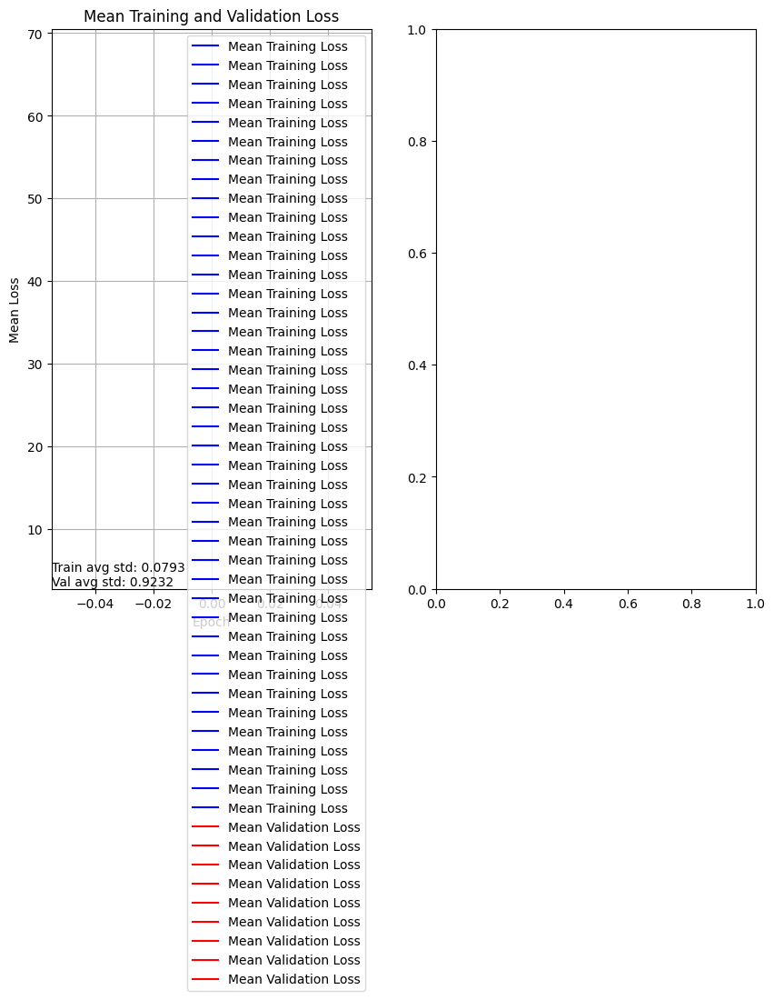

In [ ]:
    # Dataloaders
train_loader, val_loader = get_all_dataloaders(
    data_dir=data_dir,
    csv_file=csv_file,
    grid_size=7,
    batch_size=batch_size,
    val_split=0.2,
    seed=SEED[0]
)


t_yolov1 = train_model_3_times(
    model_type='yolov1',
    train_loader=train_loader,
    val_loader=val_loader,
    random_seeds=SEED,
    grid_size=7,
    epochs=epochs,
    learning_rate=learning_rate,
    device=device
)



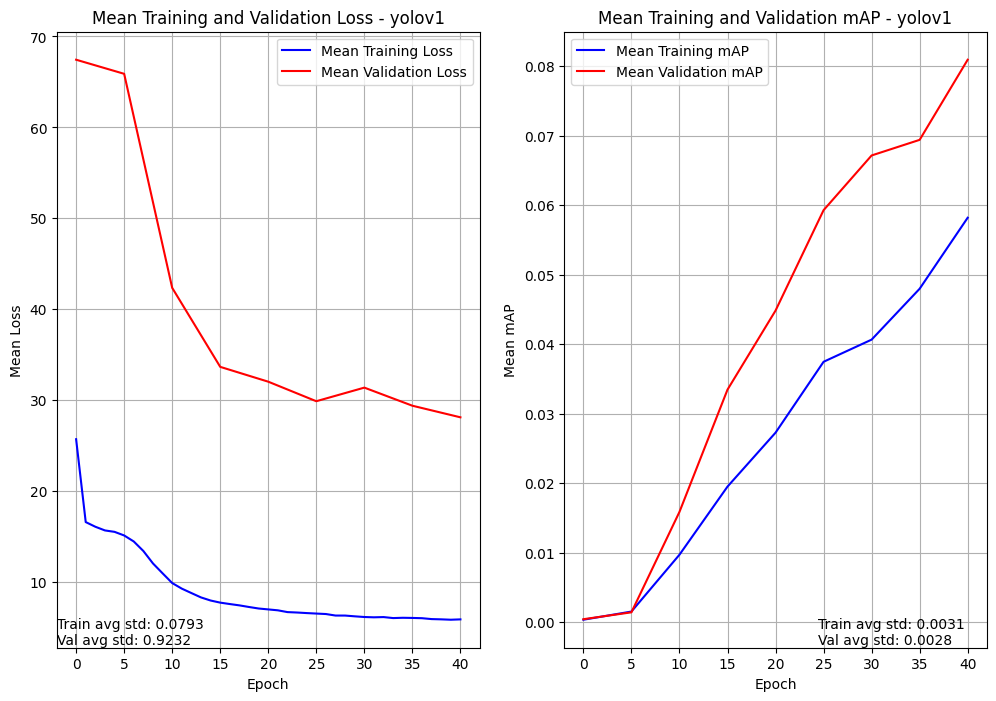

In [26]:
hist_path = 'runs/yolov1_s_7_list_of_hist.pkl'
with open(hist_path, 'rb') as file:
    data = pickle.load(file)
    analyze_multi_run_training(data, 'yolov1')

In [19]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
t_yolov1 = Yolov1(7,2,1)
t_yolov1.load_state_dict(torch.load('runs/yolov1_s_7__seed_3.pt', map_location=device))
t_yolov1.to(device)
test(t_yolov1, test_dir, conf_thresh=0.25)

RuntimeError: PytorchStreamReader failed reading zip archive: failed finding central directory

Training of a yolov1 model with FPN enhanced backbone

Dataset initialized with 3373 images
Total annotations: 147793


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(


Epoch [1/41] - Train Loss: 32.8964
Train mAP for epoch: 0.00360426539555192
Val mAP for epoch: 0.0010200674878433347
           Validation Loss: 65.9711


Epoch [2/41] - Train Loss: 19.9136


Epoch [3/41] - Train Loss: 17.1051


Epoch [4/41] - Train Loss: 15.4543


Epoch [5/41] - Train Loss: 14.8663


Epoch [6/41] - Train Loss: 13.6180
Train mAP for epoch: 0.0026037569623440504
Val mAP for epoch: 0.003579118987545371
           Validation Loss: 57.0279


Epoch [7/41] - Train Loss: 12.7159


Epoch [8/41] - Train Loss: 12.3163


Epoch [9/41] - Train Loss: 11.4832


Epoch [10/41] - Train Loss: 11.0202


Epoch [11/41] - Train Loss: 10.5069
Train mAP for epoch: 0.012689654715359211
Val mAP for epoch: 0.01616966910660267
           Validation Loss: 46.3283


Epoch [12/41] - Train Loss: 10.4002


Epoch [13/41] - Train Loss: 10.1011


Epoch [14/41] - Train Loss: 9.7314


Epoch [15/41] - Train Loss: 9.4199


Epoch [16/41] - Train Loss: 9.1638
Train mAP for epoch: 0.008282342925667763
Val mAP for epoch: 0.017052650451660156
           Validation Loss: 35.0884


Epoch [17/41] - Train Loss: 9.1975


Epoch [18/41] - Train Loss: 9.2134


Epoch [19/41] - Train Loss: 8.7229


Epoch [20/41] - Train Loss: 8.6323


Epoch [21/41] - Train Loss: 8.3208
Train mAP for epoch: 0.014753518626093864
Val mAP for epoch: 0.026829048991203308
           Validation Loss: 35.6987


Epoch [22/41] - Train Loss: 8.4573


Epoch [23/41] - Train Loss: 8.1817


Epoch [24/41] - Train Loss: 7.9706


Epoch [25/41] - Train Loss: 8.0826


Epoch [26/41] - Train Loss: 8.0110
Train mAP for epoch: 0.024173375219106674
Val mAP for epoch: 0.03446216508746147
           Validation Loss: 34.8927


Epoch [27/41] - Train Loss: 7.8517


Epoch [28/41] - Train Loss: 7.6099


Epoch [29/41] - Train Loss: 7.6035


Epoch [30/41] - Train Loss: 7.4312


Epoch [31/41] - Train Loss: 7.4503
Train mAP for epoch: 0.02608010172843933
Val mAP for epoch: 0.03791074454784393
           Validation Loss: 33.1957


Epoch [32/41] - Train Loss: 7.2261


Epoch [33/41] - Train Loss: 7.3709


Epoch [34/41] - Train Loss: 7.4265


Epoch [35/41] - Train Loss: 7.2658


Epoch [36/41] - Train Loss: 7.1504
Train mAP for epoch: 0.03385261818766594
Val mAP for epoch: 0.0447232648730278
           Validation Loss: 32.1234


Epoch [37/41] - Train Loss: 7.1440


Epoch [38/41] - Train Loss: 7.1621


Epoch [39/41] - Train Loss: 7.1411


Epoch [40/41] - Train Loss: 6.8689


Epoch [41/41] - Train Loss: 6.8935
Train mAP for epoch: 0.03646041452884674
Val mAP for epoch: 0.05481463670730591
           Validation Loss: 29.7508


Epoch [1/41] - Train Loss: 33.2326
Train mAP for epoch: 5.265518120722845e-05
Val mAP for epoch: 0.0008817058405838907
           Validation Loss: 66.1633


Epoch [2/41] - Train Loss: 20.2968


Epoch [3/41] - Train Loss: 17.2888


Epoch [4/41] - Train Loss: 15.9356


Epoch [5/41] - Train Loss: 14.7940


Epoch [6/41] - Train Loss: 13.7018
Train mAP for epoch: 0.0019184078555554152
Val mAP for epoch: 0.0034689500462263823
           Validation Loss: 56.3611


Epoch [7/41] - Train Loss: 13.1053


Epoch [8/41] - Train Loss: 12.1227


Epoch [9/41] - Train Loss: 12.0966


Epoch [10/41] - Train Loss: 11.7899


Epoch [11/41] - Train Loss: 10.8789
Train mAP for epoch: 0.008701945655047894
Val mAP for epoch: 0.01080032903701067
           Validation Loss: 46.3550


Epoch [12/41] - Train Loss: 10.4137


Epoch [13/41] - Train Loss: 10.1091


Epoch [14/41] - Train Loss: 9.9558


Epoch [15/41] - Train Loss: 9.5370


Epoch [16/41] - Train Loss: 9.3038
Train mAP for epoch: 0.010276512242853642
Val mAP for epoch: 0.01774347573518753
           Validation Loss: 43.2798


Epoch [17/41] - Train Loss: 9.3726


Epoch [18/41] - Train Loss: 9.2750


Epoch [19/41] - Train Loss: 9.2738


Epoch [20/41] - Train Loss: 8.7616


Epoch [21/41] - Train Loss: 8.7872
Train mAP for epoch: 0.012587049975991249
Val mAP for epoch: 0.016620906069874763
           Validation Loss: 35.0957


Epoch [22/41] - Train Loss: 8.5831


Epoch [23/41] - Train Loss: 8.3039


Epoch [24/41] - Train Loss: 8.1777


Epoch [25/41] - Train Loss: 7.9792


Epoch [26/41] - Train Loss: 8.2232
Train mAP for epoch: 0.01839275471866131
Val mAP for epoch: 0.030882002785801888
           Validation Loss: 36.1254


Epoch [27/41] - Train Loss: 7.8301


Epoch [28/41] - Train Loss: 7.5316


Epoch [29/41] - Train Loss: 7.6474


Epoch [30/41] - Train Loss: 7.6456


Epoch [31/41] - Train Loss: 7.4116
Train mAP for epoch: 0.019898800179362297
Val mAP for epoch: 0.038138169795274734
           Validation Loss: 34.7576


Epoch [32/41] - Train Loss: 7.3263


Epoch [33/41] - Train Loss: 7.3728


Epoch [34/41] - Train Loss: 7.2384


Epoch [35/41] - Train Loss: 7.3670


Epoch [36/41] - Train Loss: 7.3401
Train mAP for epoch: 0.023777734488248825
Val mAP for epoch: 0.04270925372838974
           Validation Loss: 34.0730


Epoch [37/41] - Train Loss: 7.1469


Epoch [38/41] - Train Loss: 7.3021


Epoch [39/41] - Train Loss: 7.0629


Epoch [40/41] - Train Loss: 6.9472


Epoch [41/41] - Train Loss: 6.8921
Train mAP for epoch: 0.037675417959690094
Val mAP for epoch: 0.05215108022093773
           Validation Loss: 30.2874


Epoch [1/41] - Train Loss: 33.6207
Train mAP for epoch: 0.0001801305916160345
Val mAP for epoch: 0.0006611002027057111
           Validation Loss: 65.5514


Epoch [2/41] - Train Loss: 19.5288


Epoch [3/41] - Train Loss: 16.9406


Epoch [4/41] - Train Loss: 15.3119


Epoch [5/41] - Train Loss: 14.3066


Epoch [6/41] - Train Loss: 13.3426
Train mAP for epoch: 0.0020925605203956366
Val mAP for epoch: 0.005932777188718319
           Validation Loss: 57.0213


Epoch [7/41] - Train Loss: 12.8807


Epoch [8/41] - Train Loss: 12.2297


Epoch [9/41] - Train Loss: 11.4243


Epoch [10/41] - Train Loss: 11.1420


Epoch [11/41] - Train Loss: 10.7376
Train mAP for epoch: 0.010546570643782616
Val mAP for epoch: 0.010480284690856934
           Validation Loss: 46.1780


Epoch [12/41] - Train Loss: 10.5176


Epoch [13/41] - Train Loss: 10.1842


Epoch [14/41] - Train Loss: 9.7860


Epoch [15/41] - Train Loss: 9.8971


Epoch [16/41] - Train Loss: 9.3972
Train mAP for epoch: 0.01365652959793806
Val mAP for epoch: 0.02098686806857586
           Validation Loss: 41.8269


Epoch [17/41] - Train Loss: 9.1911


Epoch [18/41] - Train Loss: 9.1021


Epoch [19/41] - Train Loss: 8.8869


Epoch [20/41] - Train Loss: 8.5263


Epoch [21/41] - Train Loss: 8.3702
Train mAP for epoch: 0.018095962703227997
Val mAP for epoch: 0.022334259003400803
           Validation Loss: 35.2593


Epoch [22/41] - Train Loss: 8.1934


Epoch [23/41] - Train Loss: 7.9652


Epoch [24/41] - Train Loss: 7.9794


Epoch [25/41] - Train Loss: 7.9008


Epoch [26/41] - Train Loss: 7.9230
Train mAP for epoch: 0.018606923520565033
Val mAP for epoch: 0.03585086762905121
           Validation Loss: 36.1040


Epoch [27/41] - Train Loss: 7.6347


Epoch [28/41] - Train Loss: 7.6408


Epoch [29/41] - Train Loss: 7.6713


Epoch [30/41] - Train Loss: 7.5107


Epoch [31/41] - Train Loss: 7.4720
Train mAP for epoch: 0.026001030579209328
Val mAP for epoch: 0.04228796809911728
           Validation Loss: 33.1920


Epoch [32/41] - Train Loss: 7.3677


Epoch [33/41] - Train Loss: 7.3570


Epoch [34/41] - Train Loss: 7.2194


Epoch [35/41] - Train Loss: 7.0018


Epoch [36/41] - Train Loss: 7.0330
Train mAP for epoch: 0.029202228412032127
Val mAP for epoch: 0.034972138702869415
           Validation Loss: 33.5155


Epoch [37/41] - Train Loss: 7.0540


Epoch [38/41] - Train Loss: 7.0589


Epoch [39/41] - Train Loss: 6.9970


Epoch [40/41] - Train Loss: 7.0182


Epoch [41/41] - Train Loss: 7.1440
Train mAP for epoch: 0.028775595128536224
Val mAP for epoch: 0.048244889825582504
           Validation Loss: 32.4402


ValueError: x and y must have same first dimension, but have shapes (1,) and (9,)

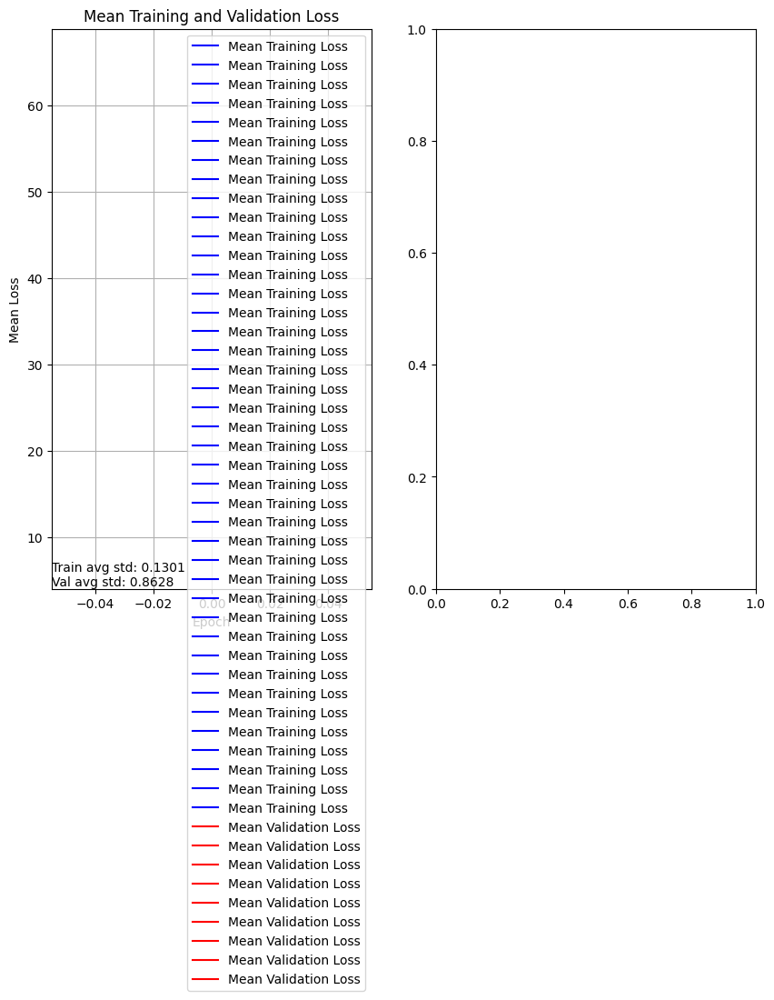

In [ ]:
train_loader, val_loader = get_all_dataloaders(
    data_dir=data_dir,
    csv_file=csv_file,
    grid_size=7,
    batch_size=batch_size,
    val_split=0.2,
    seed=SEED[0]
)

t_fpn = train_model_3_times(
    model_type='fpn',
    train_loader=train_loader,
    val_loader=val_loader,
    random_seeds=SEED,
    grid_size=7,
    epochs=epochs,
    learning_rate=learning_rate,
    device=device
)



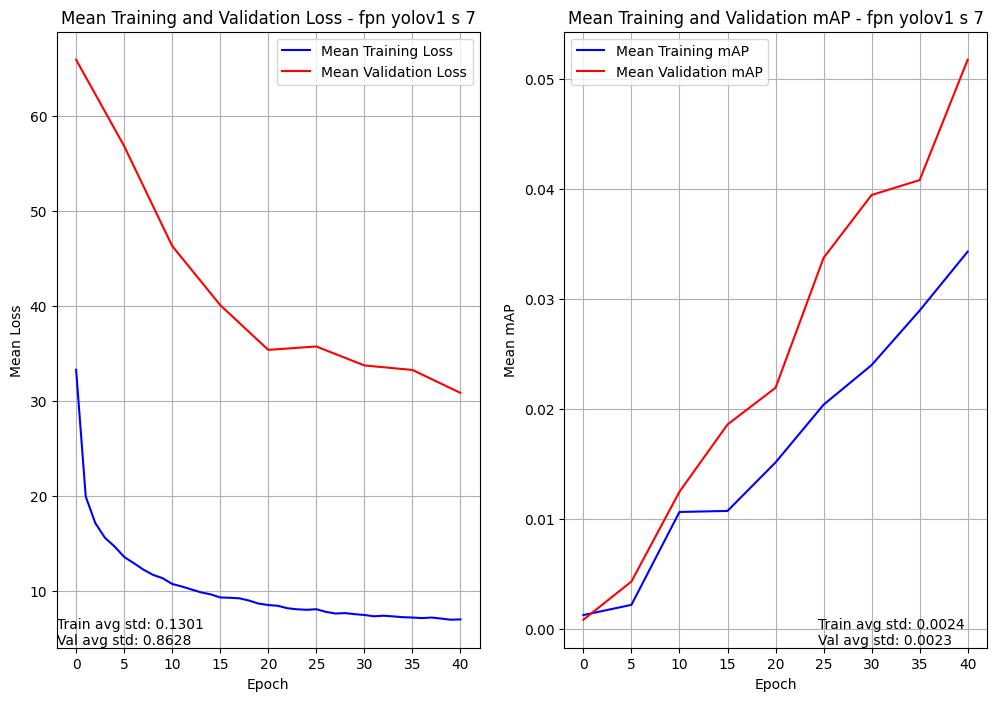

In [25]:
hist_path = 'runs/fpn_s_7_list_of_hist.pkl'
with open(hist_path, 'rb') as file:
    data = pickle.load(file)
    analyze_multi_run_training(data, 'fpn yolov1 s 7')

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(


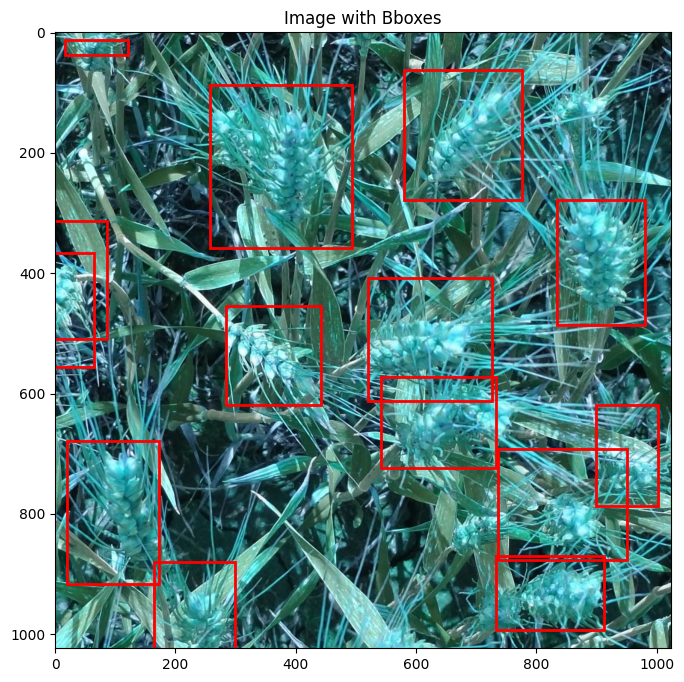

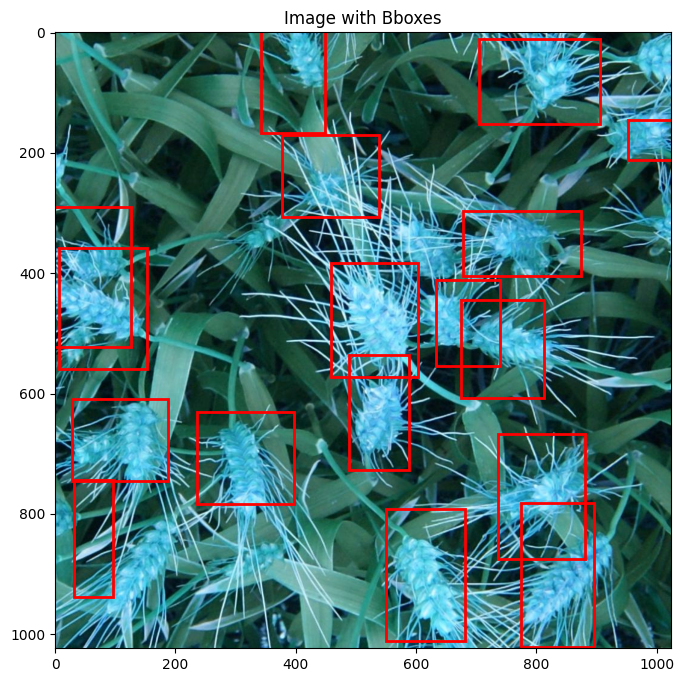

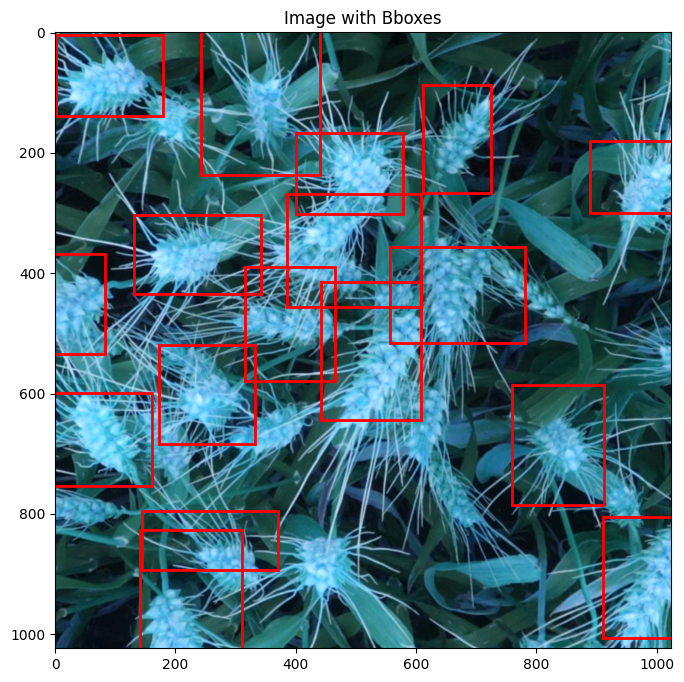

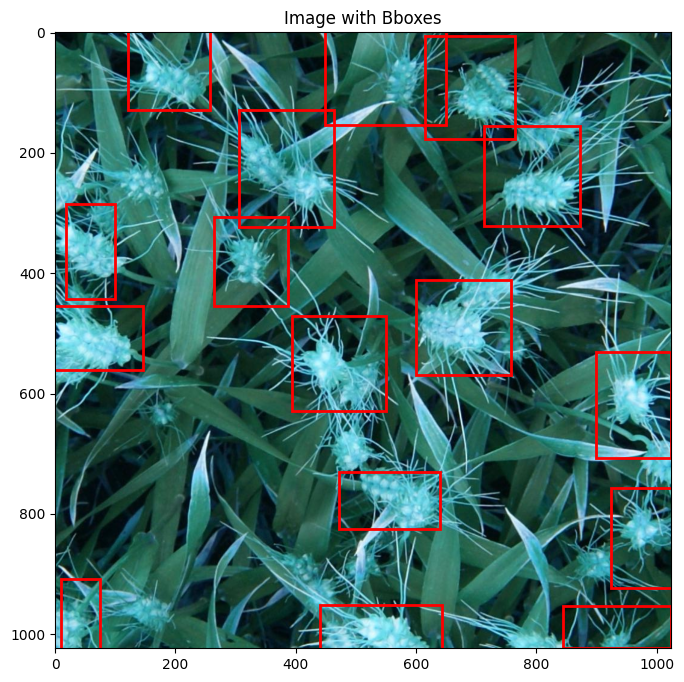

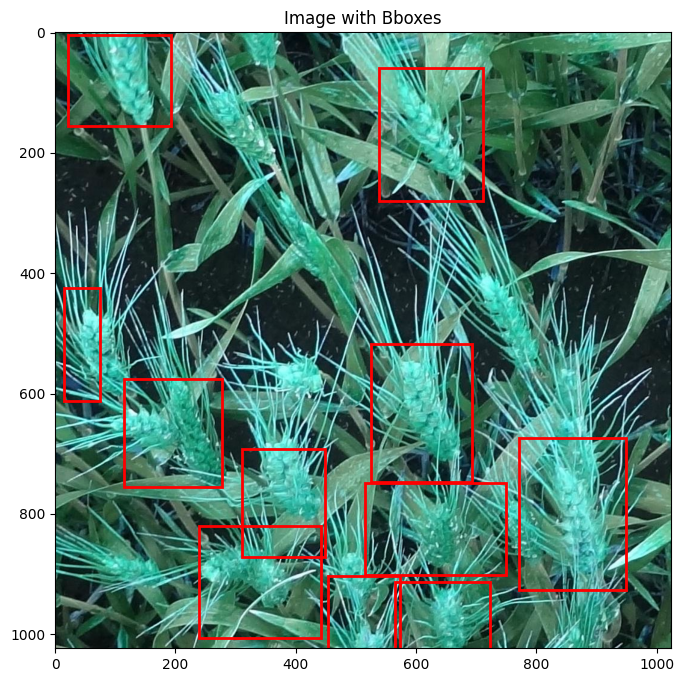

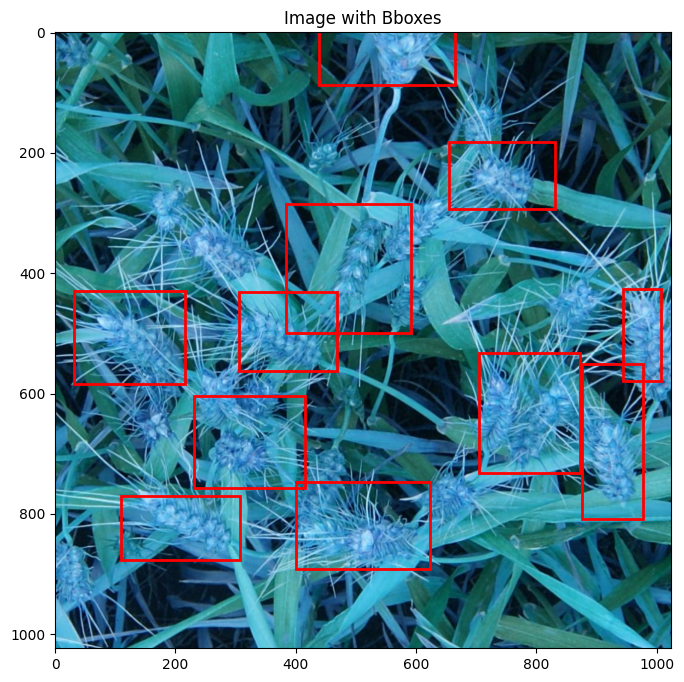

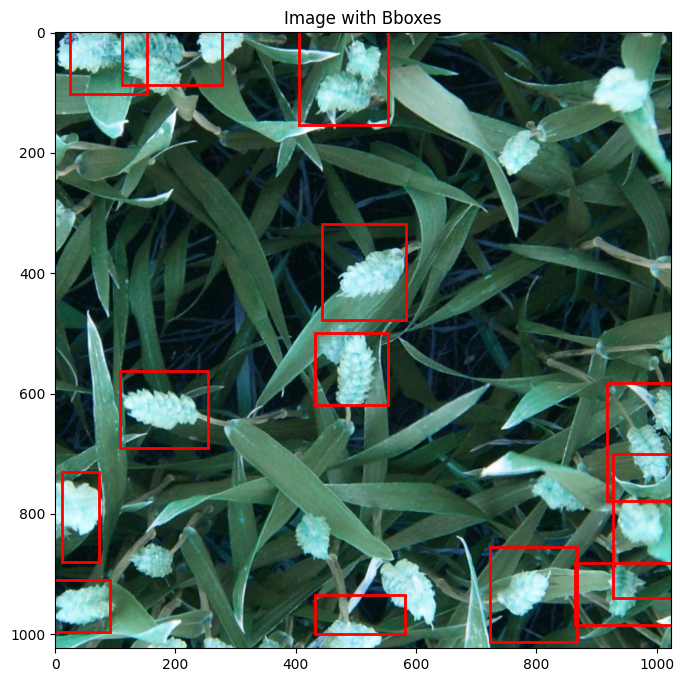

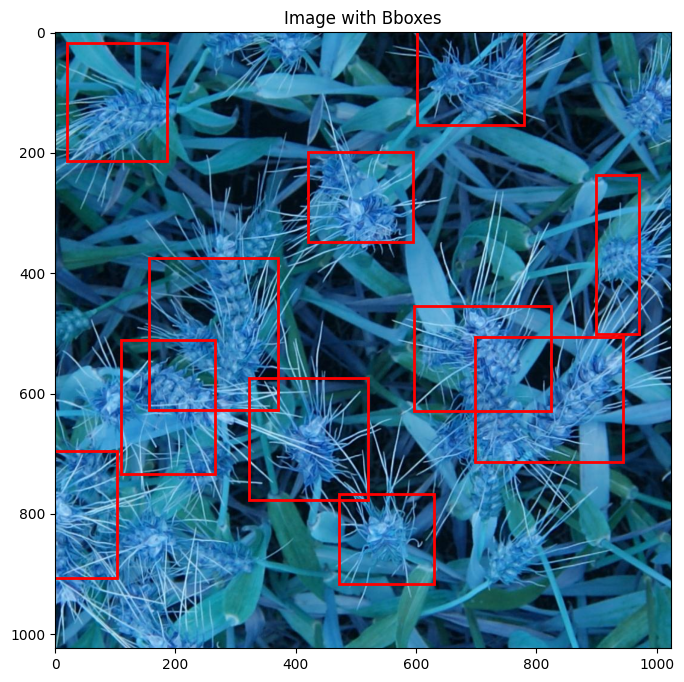

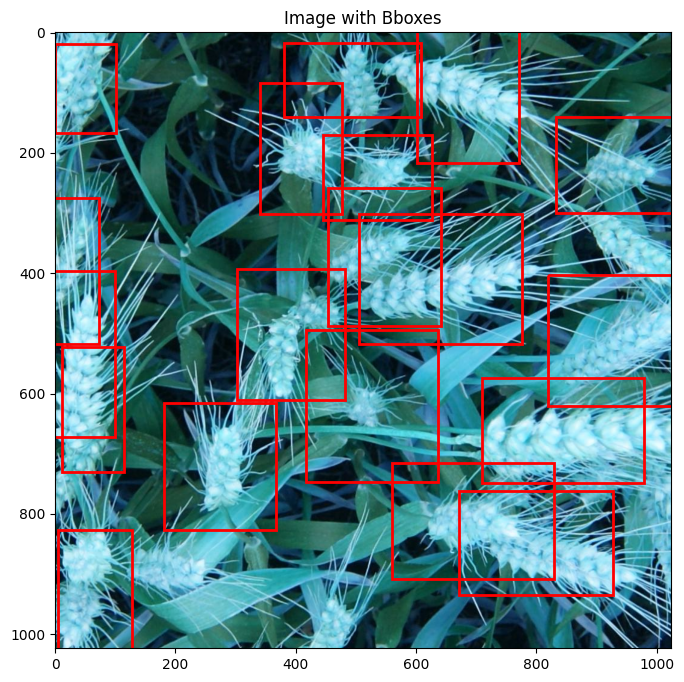

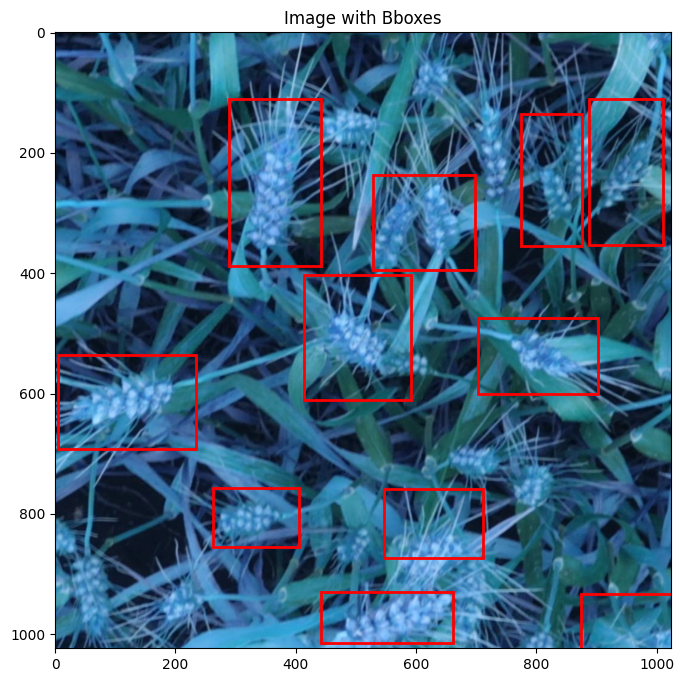

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
t_fpn = FPNYolo(7,2,1)
t_fpn.load_state_dict(torch.load('runs/fpn_s_7__seed_3.pt', map_location=device))
t_fpn.to(device)
test(t_fpn, test_dir, conf_thresh=0.25)

Training of a yolov1 model with FPN enhanced backbone and grid size of 10


In [ ]:
train_loader, val_loader = get_all_dataloaders(
    data_dir=data_dir,
    csv_file=csv_file,
    grid_size=10,
    batch_size=batch_size,
    val_split=0.2,
    seed=SEED[0]
)


t_fpn_10 = train_model_3_times(
    model_type='fpn',
    train_loader=train_loader,
    val_loader=val_loader,
    random_seeds=SEED,
    grid_size=10,
    epochs=epochs,
    learning_rate=learning_rate,
    device=device
)

Dataset initialized with 3373 images
Total annotations: 147793


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 179MB/s]


Epoch [1/41] - Train Loss: 28.5482


/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)


Train mAP for epoch: 0.0005117458640597761
Val mAP for epoch: 0.0017575090751051903
           Validation Loss: 54.0943


Epoch [2/41] - Train Loss: 17.6511


Epoch [3/41] - Train Loss: 14.7852


Epoch [4/41] - Train Loss: 13.4382


Epoch [5/41] - Train Loss: 12.9841


Epoch [6/41] - Train Loss: 12.7088
Train mAP for epoch: 0.001845511025749147
Val mAP for epoch: 0.002506178803741932
           Validation Loss: 51.3179


Epoch [7/41] - Train Loss: 12.1342


Epoch [8/41] - Train Loss: 11.7750


Epoch [9/41] - Train Loss: 11.0489


Epoch [10/41] - Train Loss: 10.6958


Epoch [11/41] - Train Loss: 10.1515
Train mAP for epoch: 0.012542566284537315
Val mAP for epoch: 0.011880828067660332
           Validation Loss: 41.9878


Epoch [12/41] - Train Loss: 10.0379


Epoch [13/41] - Train Loss: 9.5244


Epoch [14/41] - Train Loss: 9.0423


Epoch [15/41] - Train Loss: 8.9960


Epoch [16/41] - Train Loss: 8.6669
Train mAP for epoch: 0.014157183468341827
Val mAP for epoch: 0.014821329154074192
           Validation Loss: 39.0277


Epoch [17/41] - Train Loss: 8.6361


Epoch [18/41] - Train Loss: 8.6282


Epoch [19/41] - Train Loss: 8.2818


Epoch [20/41] - Train Loss: 8.2626


Epoch [21/41] - Train Loss: 8.1829
Train mAP for epoch: 0.023074684664607048
Val mAP for epoch: 0.020618295297026634
           Validation Loss: 37.8650


Epoch [22/41] - Train Loss: 8.1075


Epoch [23/41] - Train Loss: 7.8705


Epoch [24/41] - Train Loss: 7.6287


Epoch [25/41] - Train Loss: 7.9401


Epoch [26/41] - Train Loss: 7.5118
Train mAP for epoch: 0.02636033296585083
Val mAP for epoch: 0.023468706756830215
           Validation Loss: 35.0654


Epoch [27/41] - Train Loss: 7.5870


Epoch [28/41] - Train Loss: 7.1551


Epoch [29/41] - Train Loss: 7.2559


Epoch [30/41] - Train Loss: 7.0341


Epoch [31/41] - Train Loss: 7.0550
Train mAP for epoch: 0.016772309318184853
Val mAP for epoch: 0.03178072348237038
           Validation Loss: 35.1171


Epoch [32/41] - Train Loss: 6.8336


Epoch [33/41] - Train Loss: 6.7777


Epoch [34/41] - Train Loss: 6.6693


Epoch [35/41] - Train Loss: 6.5922


Epoch [36/41] - Train Loss: 6.6396
Train mAP for epoch: 0.02364368364214897
Val mAP for epoch: 0.031223192811012268
           Validation Loss: 35.4404


Epoch [37/41] - Train Loss: 6.6961


Epoch [38/41] - Train Loss: 6.5322


Epoch [39/41] - Train Loss: 6.5744


Epoch [40/41] - Train Loss: 6.4527


Epoch [41/41] - Train Loss: 6.4098
Train mAP for epoch: 0.029261119663715363
Val mAP for epoch: 0.034925878047943115
           Validation Loss: 34.2350


Epoch [1/41] - Train Loss: 30.2372
Train mAP for epoch: 0.00021258534980006516
Val mAP for epoch: 0.0006710259476676583
           Validation Loss: 55.3140


Epoch [2/41] - Train Loss: 17.9654


Epoch [3/41] - Train Loss: 15.3174


Epoch [4/41] - Train Loss: 14.0115


Epoch [5/41] - Train Loss: 13.0454


Epoch [6/41] - Train Loss: 12.8616
Train mAP for epoch: 0.0035087717697024345
Val mAP for epoch: 0.0022937734611332417
           Validation Loss: 50.6116


Epoch [7/41] - Train Loss: 12.4216


Epoch [8/41] - Train Loss: 11.6957


Epoch [9/41] - Train Loss: 11.4744


Epoch [10/41] - Train Loss: 11.1961


Epoch [11/41] - Train Loss: 10.6630
Train mAP for epoch: 0.003402563976123929
Val mAP for epoch: 0.006508134305477142
           Validation Loss: 47.7505


Epoch [12/41] - Train Loss: 10.4102


Epoch [13/41] - Train Loss: 10.4277


Epoch [14/41] - Train Loss: 10.1565


Epoch [15/41] - Train Loss: 9.5635


Epoch [16/41] - Train Loss: 9.0695
Train mAP for epoch: 0.01293130498379469
Val mAP for epoch: 0.012791254557669163
           Validation Loss: 42.0528


Epoch [17/41] - Train Loss: 9.0002


Epoch [18/41] - Train Loss: 8.7509


Epoch [19/41] - Train Loss: 8.7140


Epoch [20/41] - Train Loss: 8.8054


Epoch [21/41] - Train Loss: 8.5267
Train mAP for epoch: 0.016725527122616768
Val mAP for epoch: 0.018073515966534615
           Validation Loss: 37.1578


Epoch [22/41] - Train Loss: 8.1542


Epoch [23/41] - Train Loss: 7.7679


Epoch [24/41] - Train Loss: 8.0945


Epoch [25/41] - Train Loss: 7.8054


Epoch [26/41] - Train Loss: 7.7462
Train mAP for epoch: 0.012540116906166077
Val mAP for epoch: 0.022150171920657158
           Validation Loss: 38.1336


Epoch [27/41] - Train Loss: 7.5630


Epoch [28/41] - Train Loss: 7.4530


Epoch [29/41] - Train Loss: 7.3797


Epoch [30/41] - Train Loss: 7.2163


Epoch [31/41] - Train Loss: 7.1791
Train mAP for epoch: 0.021216748282313347
Val mAP for epoch: 0.02973557636141777
           Validation Loss: 36.3179


Epoch [32/41] - Train Loss: 7.0782


Epoch [33/41] - Train Loss: 6.9705


Epoch [34/41] - Train Loss: 7.2683


Epoch [35/41] - Train Loss: 7.2300


Epoch [36/41] - Train Loss: 6.8607
Train mAP for epoch: 0.023956047371029854
Val mAP for epoch: 0.027927914634346962
           Validation Loss: 34.9788


Epoch [37/41] - Train Loss: 6.7273


Epoch [38/41] - Train Loss: 6.9276


Epoch [39/41] - Train Loss: 6.6474


Epoch [40/41] - Train Loss: 6.8667


Epoch [41/41] - Train Loss: 6.5762
Train mAP for epoch: 0.02196420542895794
Val mAP for epoch: 0.03955685719847679
           Validation Loss: 33.9612


Epoch [1/41] - Train Loss: 29.5331
Train mAP for epoch: 0.0004015326267108321
Val mAP for epoch: 0.00016452329873573035
           Validation Loss: 55.4492


Epoch [2/41] - Train Loss: 17.8124


Epoch [3/41] - Train Loss: 14.9983


Epoch [4/41] - Train Loss: 13.7958


Epoch [5/41] - Train Loss: 13.1304


Epoch [6/41] - Train Loss: 12.5995
Train mAP for epoch: 0.0027017169632017612
Val mAP for epoch: 0.0026970503386110067
           Validation Loss: 51.0151


Epoch [7/41] - Train Loss: 12.3091


Epoch [8/41] - Train Loss: 11.5430


Epoch [9/41] - Train Loss: 11.2838


Epoch [10/41] - Train Loss: 10.9671


Epoch [11/41] - Train Loss: 10.6398
Train mAP for epoch: 0.007244579493999481
Val mAP for epoch: 0.007148489821702242
           Validation Loss: 44.2677


Epoch [12/41] - Train Loss: 10.0901


Epoch [13/41] - Train Loss: 9.8647


Epoch [14/41] - Train Loss: 9.2902


Epoch [15/41] - Train Loss: 8.9934


Epoch [16/41] - Train Loss: 8.8475
Train mAP for epoch: 0.014747397042810917
Val mAP for epoch: 0.013373062014579773
           Validation Loss: 39.1398


Epoch [17/41] - Train Loss: 8.8610


Epoch [18/41] - Train Loss: 8.5577


Epoch [19/41] - Train Loss: 8.4413


Epoch [20/41] - Train Loss: 8.2467


Epoch [21/41] - Train Loss: 8.1590
Train mAP for epoch: 0.01989218033850193
Val mAP for epoch: 0.020498069003224373
           Validation Loss: 37.4200


Epoch [22/41] - Train Loss: 7.8836


Epoch [23/41] - Train Loss: 7.8850


Epoch [24/41] - Train Loss: 7.8715


Epoch [25/41] - Train Loss: 7.5586


Epoch [26/41] - Train Loss: 7.5059
Train mAP for epoch: 0.016433944925665855
Val mAP for epoch: 0.022699473425745964
           Validation Loss: 35.3750


Epoch [27/41] - Train Loss: 7.3724


Epoch [28/41] - Train Loss: 7.5140


Epoch [29/41] - Train Loss: 7.5033


Epoch [30/41] - Train Loss: 7.2157


Epoch [31/41] - Train Loss: 6.9882
Train mAP for epoch: 0.01945885270833969
Val mAP for epoch: 0.03304104134440422
           Validation Loss: 35.7662


Epoch [32/41] - Train Loss: 6.9786


Epoch [33/41] - Train Loss: 7.0423


Epoch [34/41] - Train Loss: 6.7454


Epoch [35/41] - Train Loss: 6.7500


Epoch [36/41] - Train Loss: 6.8336
Train mAP for epoch: 0.03177640587091446
Val mAP for epoch: 0.02873978205025196
           Validation Loss: 35.3697


Epoch [37/41] - Train Loss: 6.9109


Epoch [38/41] - Train Loss: 6.6768


Epoch [39/41] - Train Loss: 6.5315


Epoch [40/41] - Train Loss: 6.4690


Epoch [41/41] - Train Loss: 6.4042
Train mAP for epoch: 0.02682741917669773
Val mAP for epoch: 0.0325838141143322
           Validation Loss: 33.0275


TypeError: analyze_multi_run_training() missing 1 required positional argument: 'model_type'

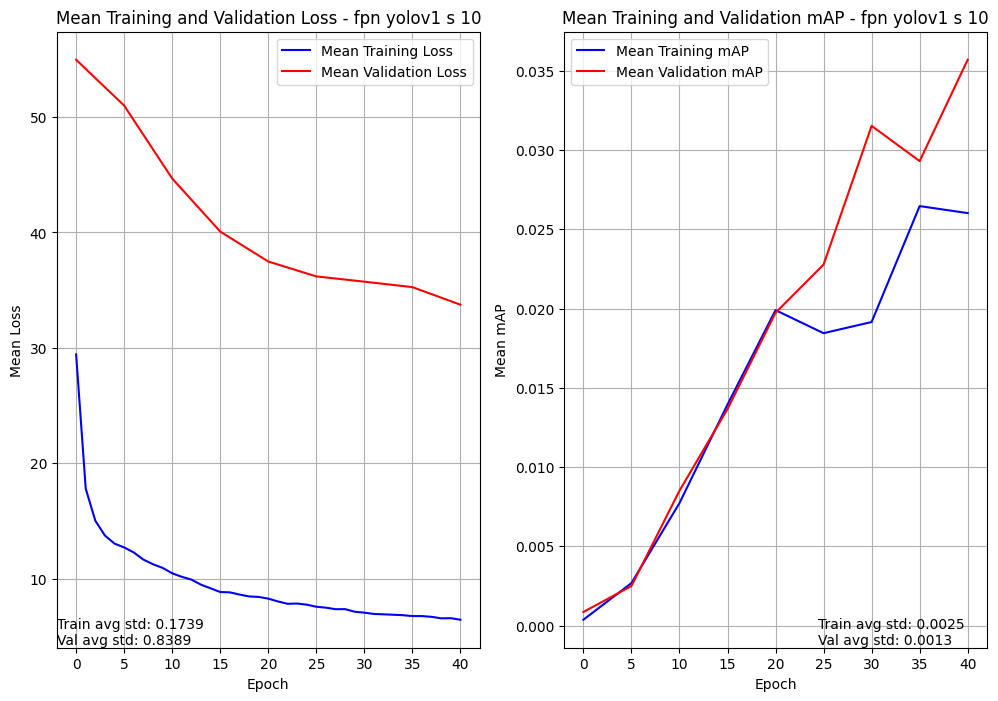

In [24]:
hist_path = 'runs/fpn_s_10_list_of_hist.pkl'
with open(hist_path, 'rb') as file:
    data = pickle.load(file)
    analyze_multi_run_training(data, 'fpn yolov1 s 10')

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
t_fpn_10 = FPNYolo(10,2,1)
t_fpn_10.load_state_dict(torch.load('runs/fpn_s_10__seed_3.pt', map_location=device))
t_fpn_10.to(device)
test(t_fpn_10, test_dir, conf_thresh=0.25)

Training of a yolov1 model with FPN enhanced backbone and grid size of 14

In [17]:
train_loader, val_loader = get_all_dataloaders(
    data_dir=data_dir,
    csv_file=csv_file,
    grid_size=14,
    batch_size=batch_size,
    val_split=0.2,
    seed=SEED[0]
)

t_fpn_14 = train_model_3_times(
    model_type='fpn',
    train_loader=train_loader,
    val_loader=val_loader,
    random_seeds=SEED,
    grid_size=14,
    epochs=epochs,
    learning_rate=learning_rate,
    device=device
)


Dataset initialized with 3373 images
Total annotations: 147793


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 183MB/s]


Epoch [1/41] - Train Loss: 44.7033


/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)


Train mAP for epoch: 9.961422620108351e-05
Val mAP for epoch: 8.042661647778004e-05
           Validation Loss: 57.7128


Epoch [2/41] - Train Loss: 20.8905


Epoch [3/41] - Train Loss: 17.1756


Epoch [4/41] - Train Loss: 15.5995


Epoch [5/41] - Train Loss: 15.0764


Epoch [6/41] - Train Loss: 14.3903
Train mAP for epoch: 0.008807589299976826
Val mAP for epoch: 0.0010905690724030137
           Validation Loss: 56.0359


Epoch [7/41] - Train Loss: 13.7956


Epoch [8/41] - Train Loss: 13.4929


Epoch [9/41] - Train Loss: 12.9240


Epoch [10/41] - Train Loss: 12.8322


Epoch [11/41] - Train Loss: 12.4726
Train mAP for epoch: 0.002395544433966279
Val mAP for epoch: 0.0039019384421408176
           Validation Loss: 50.8536


Epoch [12/41] - Train Loss: 12.5381


Epoch [13/41] - Train Loss: 12.3901


Epoch [14/41] - Train Loss: 11.7954


Epoch [15/41] - Train Loss: 11.7147


Epoch [16/41] - Train Loss: 11.4081
Train mAP for epoch: 0.00483349384739995
Val mAP for epoch: 0.007888580672442913
           Validation Loss: 48.1675


Epoch [17/41] - Train Loss: 11.2529


Epoch [18/41] - Train Loss: 11.2788


Epoch [19/41] - Train Loss: 10.9057


Epoch [20/41] - Train Loss: 10.7879


Epoch [21/41] - Train Loss: 10.7579
Train mAP for epoch: 0.011588454246520996
Val mAP for epoch: 0.01245338935405016
           Validation Loss: 47.8365


Epoch [22/41] - Train Loss: 10.5473


Epoch [23/41] - Train Loss: 10.4868


Epoch [24/41] - Train Loss: 10.1313


Epoch [25/41] - Train Loss: 10.3370


Epoch [26/41] - Train Loss: 9.9693
Train mAP for epoch: 0.009503520093858242
Val mAP for epoch: 0.014909175224602222
           Validation Loss: 44.6195


Epoch [27/41] - Train Loss: 9.8718


Epoch [28/41] - Train Loss: 9.4486


Epoch [29/41] - Train Loss: 9.5662


Epoch [30/41] - Train Loss: 9.2071


Epoch [31/41] - Train Loss: 9.5423
Train mAP for epoch: 0.020742585882544518
Val mAP for epoch: 0.01803179830312729
           Validation Loss: 43.7000


Epoch [32/41] - Train Loss: 9.2436


Epoch [33/41] - Train Loss: 9.5241


Epoch [34/41] - Train Loss: 9.1774


Epoch [35/41] - Train Loss: 9.0919


Epoch [36/41] - Train Loss: 8.8809
Train mAP for epoch: 0.01936032436788082
Val mAP for epoch: 0.023861266672611237
           Validation Loss: 44.3051


Epoch [37/41] - Train Loss: 8.8954


Epoch [38/41] - Train Loss: 8.6033


Epoch [39/41] - Train Loss: 8.6443


Epoch [40/41] - Train Loss: 8.4441


Epoch [41/41] - Train Loss: 8.4453
Train mAP for epoch: 0.01897760108113289
Val mAP for epoch: 0.023119505494832993
           Validation Loss: 40.9510


Epoch [1/41] - Train Loss: 45.7904
Train mAP for epoch: 3.132331767119467e-05
Val mAP for epoch: 0.0001437436876585707
           Validation Loss: 57.3576


Epoch [2/41] - Train Loss: 20.1331


Epoch [3/41] - Train Loss: 16.8295


Epoch [4/41] - Train Loss: 15.6779


Epoch [5/41] - Train Loss: 15.1241


Epoch [6/41] - Train Loss: 14.5045
Train mAP for epoch: 0.0011371939908713102
Val mAP for epoch: 0.0007895546732470393
           Validation Loss: 56.7263


Epoch [7/41] - Train Loss: 13.9043


Epoch [8/41] - Train Loss: 13.3267


Epoch [9/41] - Train Loss: 13.0968


Epoch [10/41] - Train Loss: 13.2709


Epoch [11/41] - Train Loss: 12.4196
Train mAP for epoch: 0.005032379180192947
Val mAP for epoch: 0.004874341655522585
           Validation Loss: 53.8284


Epoch [12/41] - Train Loss: 12.1548


Epoch [13/41] - Train Loss: 12.0333


Epoch [14/41] - Train Loss: 11.7864


Epoch [15/41] - Train Loss: 11.6165


Epoch [16/41] - Train Loss: 11.2407
Train mAP for epoch: 0.009037401527166367
Val mAP for epoch: 0.009224805980920792
           Validation Loss: 50.3024


Epoch [17/41] - Train Loss: 11.2773


Epoch [18/41] - Train Loss: 11.3002


Epoch [19/41] - Train Loss: 11.0971


Epoch [20/41] - Train Loss: 10.6555


Epoch [21/41] - Train Loss: 10.7692
Train mAP for epoch: 0.009925657883286476
Val mAP for epoch: 0.016661595553159714
           Validation Loss: 45.7633


Epoch [22/41] - Train Loss: 12.4890


Epoch [23/41] - Train Loss: 13.3336


Epoch [24/41] - Train Loss: 11.9480


Epoch [25/41] - Train Loss: 10.8419


Epoch [26/41] - Train Loss: 10.0740
Train mAP for epoch: 0.01251650508493185
Val mAP for epoch: 0.014463219791650772
           Validation Loss: 47.1362


Epoch [27/41] - Train Loss: 9.8461


Epoch [28/41] - Train Loss: 9.7640


Epoch [29/41] - Train Loss: 9.6853


Epoch [30/41] - Train Loss: 9.3130


Epoch [31/41] - Train Loss: 9.2513
Train mAP for epoch: 0.014207764528691769
Val mAP for epoch: 0.018496869131922722
           Validation Loss: 45.2511


Epoch [32/41] - Train Loss: 9.2282


Epoch [33/41] - Train Loss: 9.1783


Epoch [34/41] - Train Loss: 9.6671


Epoch [35/41] - Train Loss: 9.1001


Epoch [36/41] - Train Loss: 8.8885
Train mAP for epoch: 0.022490885108709335
Val mAP for epoch: 0.017941582947969437
           Validation Loss: 43.7205


Epoch [37/41] - Train Loss: 8.6925


Epoch [38/41] - Train Loss: 8.7995


Epoch [39/41] - Train Loss: 8.3697


Epoch [40/41] - Train Loss: 8.6350


Epoch [41/41] - Train Loss: 8.3157
Train mAP for epoch: 0.009369870647788048
Val mAP for epoch: 0.01880960911512375
           Validation Loss: 42.3724


Epoch [1/41] - Train Loss: 43.3408
Train mAP for epoch: 8.456266368739307e-05
Val mAP for epoch: 0.00011216486018383875
           Validation Loss: 57.5025


Epoch [2/41] - Train Loss: 20.5157


Epoch [3/41] - Train Loss: 16.9799


Epoch [4/41] - Train Loss: 15.5177


Epoch [5/41] - Train Loss: 14.5018


Epoch [6/41] - Train Loss: 13.5902
Train mAP for epoch: 0.0017353487201035023
Val mAP for epoch: 0.0017023008549585938
           Validation Loss: 54.4230


Epoch [7/41] - Train Loss: 13.3499


Epoch [8/41] - Train Loss: 13.0414


Epoch [9/41] - Train Loss: 12.7233


Epoch [10/41] - Train Loss: 12.6463


Epoch [11/41] - Train Loss: 12.6723
Train mAP for epoch: 0.0024218931794166565
Val mAP for epoch: 0.011261424981057644
           Validation Loss: 53.4627


Epoch [12/41] - Train Loss: 12.5101


Epoch [13/41] - Train Loss: 12.3426


Epoch [14/41] - Train Loss: 11.5510


Epoch [15/41] - Train Loss: 11.4753


Epoch [16/41] - Train Loss: 11.5219
Train mAP for epoch: 0.008073358796536922
Val mAP for epoch: 0.01032689493149519
           Validation Loss: 49.0398


Epoch [17/41] - Train Loss: 11.3436


Epoch [18/41] - Train Loss: 11.1803


Epoch [19/41] - Train Loss: 10.8674


Epoch [20/41] - Train Loss: 10.4998


Epoch [21/41] - Train Loss: 10.8203
Train mAP for epoch: 0.009706249460577965
Val mAP for epoch: 0.010539263486862183
           Validation Loss: 47.3852


Epoch [22/41] - Train Loss: 10.2733


Epoch [23/41] - Train Loss: 9.9387


Epoch [24/41] - Train Loss: 10.2254


Epoch [25/41] - Train Loss: 9.8990


Epoch [26/41] - Train Loss: 9.9449
Train mAP for epoch: 0.010952578857541084
Val mAP for epoch: 0.01343625783920288
           Validation Loss: 44.4050


Epoch [27/41] - Train Loss: 9.6242


Epoch [28/41] - Train Loss: 9.6561


Epoch [29/41] - Train Loss: 10.0302


Epoch [30/41] - Train Loss: 9.3535


Epoch [31/41] - Train Loss: 8.9749
Train mAP for epoch: 0.019276846200227737
Val mAP for epoch: 0.01920853555202484
           Validation Loss: 43.9990


Epoch [32/41] - Train Loss: 9.0035


Epoch [33/41] - Train Loss: 8.9132


Epoch [34/41] - Train Loss: 8.6843


Epoch [35/41] - Train Loss: 8.7139


Epoch [36/41] - Train Loss: 8.7341
Train mAP for epoch: 0.016498152166604996
Val mAP for epoch: 0.0169216338545084
           Validation Loss: 43.2618


Epoch [37/41] - Train Loss: 8.4788


Epoch [38/41] - Train Loss: 8.3404


Epoch [39/41] - Train Loss: 8.2492


Epoch [40/41] - Train Loss: 8.3015


Epoch [41/41] - Train Loss: 8.2552
Train mAP for epoch: 0.020685669034719467
Val mAP for epoch: 0.01977543532848358
           Validation Loss: 39.3619


TypeError: analyze_multi_run_training() missing 1 required positional argument: 'model_type'

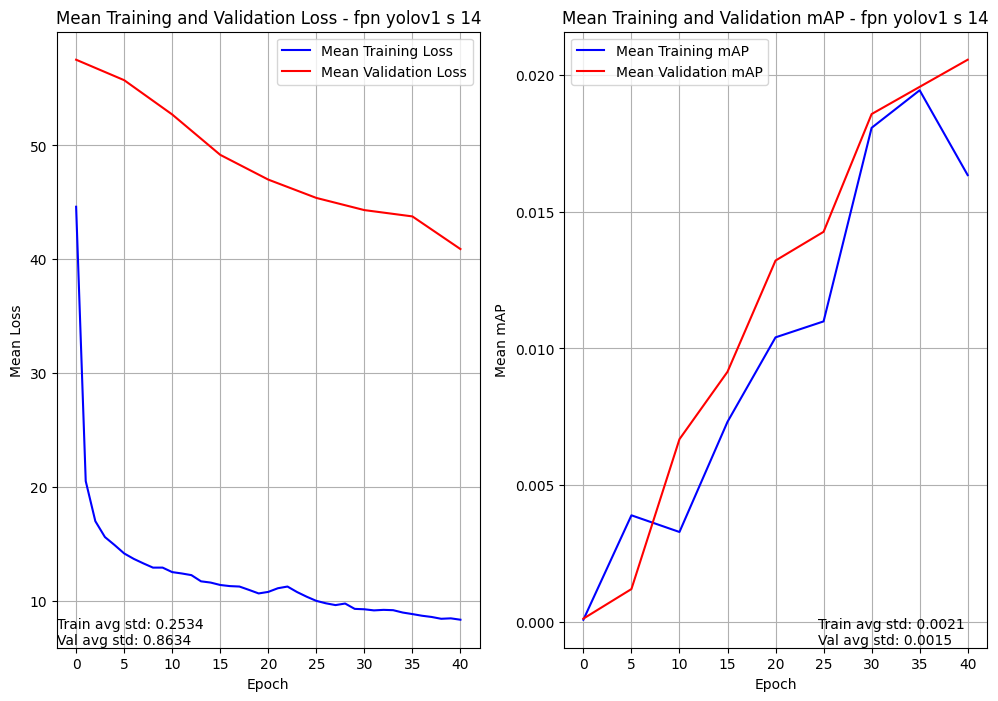

In [27]:
hist_path = 'runs/fpn_s_14_list_of_hist.pkl'
with open(hist_path, 'rb') as file:
    data = pickle.load(file)
    analyze_multi_run_training(data, 'fpn yolov1 s 14')

In [ ]:
t_fpn_14 = FPNYolo(14, 2, 1)
t_fpn_14.load_state_dict(torch.load('runs/fpn_s_14__seed_7.pt'))
test(t_fpn_14, test_dir, conf_thresh=0.25)

In [ ]:
import gc
torch.cuda.empty_cache()
gc.collect()

In [ ]:
torch.cuda.memory_summary()